In [3]:
import numpy as np
import pandas as pd
from clusterian import misc, enrich, metrics
from importlib import reload
import os
import pickle
import random
import scipy.sparse as sp
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, SpectralClustering, DBSCAN, AgglomerativeClustering
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram
import seaborn as sns

In [4]:
def createRand(sizes, genes, nrep=100):
    rand_ = pd.DataFrame(0, index=genes, columns=[i for i in range(len(sizes)*nrep)])
    pop = [i for i in range(len(genes))]
    i = 0
    for s in sizes:
        for n in range(nrep):
            inCl = random.sample(pop, k=s)
            rand_.iloc[inCl, i] = 1
            i+=1
    return rand_

In [5]:
def coverTest(cover, rand_cover):
    # drop rows with Nan value
    cv = cover.dropna() 
    rand_cv = rand_cover.dropna()
    
    pval = pd.Series(None, index=cover.index, name= 'P-value', dtype=float)
    
    for i,cl in enumerate(cv.index):
        nGenes = cv.iloc[i,-1]
        rcv_ssize = rand_cv.loc[rand_cv.iloc[:,-1]==nGenes,'Cover']
        c = cv.loc[cl,'Cover']
        if len(rcv_ssize)==0:

            p = None
        else:
            p = sum(rcv_ssize>=c)/len(rcv_ssize)

        pval.at[cl] = p
    cvTest = pd.concat((cv,pval), axis=1)
    return cvTest

In [6]:
import requests, sys

In [7]:
def getGO(enr, string=False):
    GO = []
    for t in enr.loc[:,'Term']:
        GO.append(t.split(' ')[-1][1:-1])
    if not string:
        return GO
    return ','.join(GO)

In [8]:
def getOntology(enr):
    go = getGO(enr, string=True)
    urlBase = "https://www.ebi.ac.uk/QuickGO/services/ontology/go/terms/{ids}/chart?ids="

    GO_str = go.replace(':','%3A').replace(',','%2C')
    requestURL = urlBase+GO_str
    return requestURL

In [9]:
def saveOntology(requestURL, fname, imgDir):
    r = requests.get(requestURL, headers={ "Accept" : "image/png"})

    if not r.ok:
        #r.raise_for_status()
        #sys.exit()
        print('r not ok')

    f = open(os.path.join(imgDir,fname+'.png'), 'wb')
    f.write(r.content)
    f.close()

In [10]:
def saveEnriched_bestCl(bestCl_sort, dataset, sol_enr_dir, ntoAnalyse=None, score_th=None, alpha=0.01, ovlp_th=None, imgDir = './img', dfDir='./bestCl', fpreffix=''):
    if type(ntoAnalyse)==type(None):
        ntoAnalyse = bestCl_sort.shape[0]
    for iscl in range(ntoAnalyse):
        serie = bestCl_sort.iloc[iscl,:]
        sol_pref = serie.at['Sol']
        cl = serie.at['Cl']

        enr, _, _ = enrich.getEnrich_cl(os.path.join(sol_enr_dir,sol_pref), cl, 
                                               score_th=score_th, pval=alpha, ovlp_th=ovlp_th)
        URLont = getOntology(enr)
        fname =  fpreffix+dataset +'_'+str(iscl)+'_'+sol_pref+'_'+str(cl)
        saveOntology(URLont, fname, imgDir)
        enr.to_csv(os.path.join(dfDir,fname+'.csv'), header=True, sep=';')
        print(fname)

In [11]:
def runCVtest(prefixes, mm_dir, enr_dir, rand_set_cover, alpha=None, score_th=500, ovlp_th=None):
    cvTest_res = {}
    for pref in prefixes:
        print(pref)
        dataset = pref.split('_')[1]
        mm = misc.load_mm(os.path.join(mm_dir,pref+'.csv'))
        cover = enrich.getEnrich_cover(os.path.join(enr_dir,pref), mm, pval=alpha, score=score_th, ovlp_th=ovlp_th)
        cvTest_res[pref] = coverTest(
            cover,rand_set_cover[dataset]
        ).sort_values(['P-value','Cover','# genes'], ascending=[True,False,False])
    return cvTest_res

In [12]:
def loadRandmm(mm_path):
    f = open(mm_path, 'br')
    mm_csc, mm_csc_i = pickle.load(f)
    f.close()
    mm = pd.DataFrame(mm_csc.todense(), index=mm_csc_i)
    return mm

In [13]:
def runBestClEval(randDir, rand_pref, rand_mm, DataSets, prefixes, sol_mm_dir, sol_enr_dir, alpha = 0.05, ovlp_th = 0.25, score_th = 1e3 ,cv_th = 0.25, save=True):
	fprefix = 'a'+str(alpha)+'_o'+str(ovlp_th)+'_s'+str(score_th)
	
	inDir = []
	for root,dirs,files in os.walk(os.path.join(randDir,'Cover')):
		inDir.extend(files)
		break
	#print(inDir)
		
	randCv_file = os.path.join(randDir,'Cover',fprefix+'_rand_cv.txt')
	#print(randCv_file)
	if randCv_file.split('/')[-1] in inDir:
		print('Load rand_cv')
		f = open(randCv_file, 'rb')
		rand_cv = pickle.load(f)
		f.close()
		print('rand_cv loaded')
	else:
		randEnr_dir = os.path.join(randDir, 'Enrich')
		randCv_rna_file = os.path.join(randDir,'Cover',fprefix+'_rand_cv_rna.txt')
		randCv_g2v_file = os.path.join(randDir,'Cover',fprefix+'_rand_cv_g2v.txt')
		#print(randCv_rna_file)
		#print(randCv_g2v_file)
		if randCv_rna_file.split('/')[-1] in inDir:
			print('Load rand_cv_rna')
			f = open(randCv_rna_file, 'rb')
			rand_cv_rna = pickle.load(f)
			f.close()
			print('rand_cv_rna loaded')
		else:
			print('Compute rand_cv_rna')
			rand_cv_rna = enrich.getEnrich_cover(os.path.join(randEnr_dir, rand_pref['rna']), rand_mm['rna'], pval=alpha, score=score_th, ovlp_th=ovlp_th)
			f = open(randCv_rna_file, 'bw')
			pickle.dump(rand_cv_rna, f)
			f.close()
			print('rand_cv_rna saved')
			
		if randCv_g2v_file.split('/')[-1] in inDir:
			print('Load rand_cv_g2v')
			f = open(randCv_g2v_file, 'rb')
			rand_cv_g2v = pickle.load(f)
			f.close()
			print('rand_cv_g2v loaded')
		else:
			print('Compute rand_cv_g2v')
			rand_cv_g2v = enrich.getEnrich_cover(os.path.join(randEnr_dir, rand_pref['g2v']), rand_mm['g2v'], pval=alpha, score=score_th, ovlp_th=ovlp_th)
			f = open(randCv_g2v_file, 'bw')
			pickle.dump(rand_cv_g2v, f)
			f.close()
			print('rand_cv_g2v saved')
			
		print('Create rand_cv')
		rand_cv = {'rna':rand_cv_rna, 'g2v':rand_cv_g2v}
		f = open(randCv_file, 'bw')
		pickle.dump(rand_cv, f)
		f.close()
		print('rand_cv saved')
    	
	cvRes_file = os.path.join(randDir,'Cover',fprefix+'_cv.txt')
	if cvRes_file.split('/')[-1] in inDir:
		print('Load cv_res')
		f = open(cvRes_file, 'rb')
		cv_res = pickle.load(f)
		f.close()
		print('cv_res loaded')
	else:
		print('Compute cv_res')
		cv_res = runCVtest(prefixes, sol_mm_dir, sol_enr_dir, rand_cv, alpha=alpha, score_th=score_th, ovlp_th=ovlp_th)
		for sol in cv_res:
			cv_res[sol] = cv_res[sol].dropna(axis=0)
		f = open(cvRes_file, 'bw')
		pickle.dump(cv_res, f)
		f.close()
		print('cv_res saved')
    
	print('Create cv_ds')
	cv_ds_ = {ds:[] for ds in DataSets}
	for s in cv_res:
		ds = s.split('_')[1]
		sol = pd.Series([s]*cv_res[s].shape[0], index = cv_res[s].index, name='Sol')
		cl = pd.Series(cv_res[s].index, index = cv_res[s].index, name='Cl')
		df = pd.concat([sol, cl, cv_res[s]], axis=1)
		cv_ds_[ds].append(df)
        
	cv_ds = {ds:pd.concat(cv_ds_[ds], axis=0).sort_values(['P-value','Cover','# genes'], ascending=[True,False,False]) for ds in DataSets}
	keep_cv_ds = {}
	for ds in DataSets:
		df = cv_ds[ds]
		cond1 = df.loc[:,'P-value']<=alpha
		cond2 = df.loc[:,'Cover']>=cv_th
		cond = cond1*cond2
		keep_cv_ds[ds] = df.loc[cond,:]
	print('cv_ds created')
    	
	if save:
		print('Save cv_ds')
		for ds in DataSets:
			saveEnriched_bestCl(keep_cv_ds[ds], ds, sol_enr_dir, ntoAnalyse=None, score_th=score_th, alpha=alpha, ovlp_th=ovlp_th, imgDir = './img', dfDir='./bestCl', fpreffix=fprefix+'_')
		print('cv_ds saved')
	return keep_cv_ds    

In [14]:
summary_all = misc.summary_all()

In [15]:
alpha = 0.01

In [194]:
doc = "/home/ldap/ipellet/Documents/"
clustering_dir = os.path.join(doc,'Clustering')

# Create Rand matrices

In [195]:
rand_mm_dir = os.path.join(clustering_dir,'rand_mm')
nrep = 50

## RNA

In [196]:
rand_rna_file = os.path.join(rand_mm_dir,'rand_rna_'+str(nrep))

In [197]:
rna = pd.read_csv(os.path.join(doc,'data/DataRnaseq_Transposed.csv'), index_col=0)
rna.head()

,1,2,3,6,12,13,14,16,18,21,...,375,376,377,378,379,380,381,382,383,384
TSPAN6,2.348504,0.000000,3.169852,2.891336,3.858924,2.651213,2.742435,2.227225,2.197498,0.000000,...,2.607402,2.977679,2.961305,1.792733,2.738869,2.785655,2.659470,3.213155,2.733867,2.824693
DPM1,2.499342,2.385936,2.669347,2.715486,3.093237,1.367860,2.804962,2.030681,3.219171,3.246968,...,3.174785,2.656605,2.971944,2.491913,2.939316,3.907881,3.224327,3.141350,3.457804,2.961493
SCYL3,3.708034,3.031990,4.151606,4.194226,4.169525,3.867674,3.943253,2.655953,3.899867,2.972166,...,4.325659,4.037572,3.750378,3.446573,3.957723,3.897978,3.499286,3.320137,3.695153,3.586548
C1orf112,3.473538,2.385936,4.049701,3.723256,3.791233,3.253431,3.598970,2.391411,3.508284,3.462303,...,3.551197,2.997671,3.655313,2.629885,3.087747,3.978672,2.659470,2.097338,3.314001,2.985182
FGR,3.508168,4.740541,2.901855,2.687637,1.192021,2.118343,2.726172,2.227225,2.109040,2.591975,...,2.714580,2.116040,2.832102,3.414750,2.862954,2.448971,2.494786,2.564371,3.102852,3.783862


In [13]:
summary_rna = summary_all.loc[summary_all.loc[:,'Dataset']=='rna',:]
sizes_rna = np.unique(summary_rna.iloc[:,-1].explode())

In [14]:
rand_rna = createRand(sizes_rna, rna.index, nrep=nrep)

In [15]:
rand_rna_csc = sp.csc_matrix(rand_rna)

In [16]:
f = open(rand_rna_file+'.txt', 'bw')
pickle.dump((rand_rna_csc,rna.index), f)
f.close()

In [17]:
f = open(rand_rna_file+'.txt', 'br')
rand_rna_csc, rand_rna_csc_i = pickle.load(f)
f.close()

In [18]:
rand_rna = pd.DataFrame(rand_rna_csc.todense(), index=rand_rna_csc_i)
rand_rna.head()

,0,1,2,3,4,5,6,7,8,9,...,29090,29091,29092,29093,29094,29095,29096,29097,29098,29099
TSPAN6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
DPM1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0
SCYL3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
C1orf112,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,1,0,0
FGR,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,0,0,0


## G2V

In [19]:
rand_g2v_file = os.path.join(rand_mm_dir,'rand_g2v_'+str(nrep))

In [198]:
g2v = pd.read_csv(os.path.join(doc,'data/G2V_5000genes.csv'), index_col=0)
g2v.head()

,0.1,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,,,,,,,,,,,,,,,,,,,,,
PLAC4,-0.032111,0.005355,-0.001208,0.392700,0.027191,0.057858,-0.065911,0.256802,0.043661,0.081228,...,0.179668,0.199858,-0.044920,0.095846,0.041332,-0.147439,0.239312,-0.183174,-0.264830,0.104818
RPS2P45,-0.433589,0.383065,0.154259,-0.044726,0.406748,0.089424,0.186105,-0.038986,0.245488,-0.712083,...,0.079383,-0.028575,0.263809,0.177087,-0.015819,0.120731,-0.219403,0.199372,0.101292,-0.054681
C3orf18,0.030009,-0.283322,0.213689,0.084640,-0.012634,-0.288767,-0.004061,-0.089572,0.249219,0.164836,...,0.037768,0.328689,0.064318,0.026143,0.005801,-0.185695,0.067693,-0.246346,-0.120931,0.157672
C6orf226,0.029573,-0.058847,-0.297716,0.257432,0.062723,0.071785,-0.079403,0.420420,0.219320,0.316385,...,0.243931,-0.075696,0.092758,0.093465,-0.191904,-0.286557,-0.140394,-0.159963,-0.223003,0.250665
CISD3,0.148815,-0.100394,0.139844,-0.156749,-0.000815,0.115267,0.101778,0.158580,0.287842,0.049861,...,0.227863,0.086968,0.062115,0.314489,-0.148824,-0.121338,-0.245106,0.247893,-0.034497,0.038109


In [21]:
summary_g2v = summary_all.loc[summary_all.loc[:,'Dataset']=='g2v',:]
sizes_g2v = np.unique(summary_g2v.iloc[:,-1].explode())

In [22]:
rand_g2v = createRand(sizes_g2v, g2v.index, nrep=nrep)

In [23]:
rand_g2v_csc = sp.csc_matrix(rand_g2v)

In [24]:
f = open(rand_g2v_file+'.txt', 'bw')
pickle.dump((rand_g2v_csc, g2v.index), f)
f.close()

In [25]:
f = open(rand_g2v_file+'.txt', 'br')
rand_g2v_csc, rand_g2v_csc_i = pickle.load(f)
f.close()

In [26]:
rand_g2v = pd.DataFrame(rand_g2v_csc.todense(), index=rand_g2v_csc_i)
rand_g2v.head()

,0,1,2,3,4,5,6,7,8,9,...,38390,38391,38392,38393,38394,38395,38396,38397,38398,38399
0,,,,,,,,,,,,,,,,,,,,,
PLAC4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,0,1,1
RPS2P45,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,1,1,0,1,0
C3orf18,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,1,1,1,1,1,0
C6orf226,0,0,0,0,0,0,0,0,0,0,...,1,0,1,1,1,0,1,0,1,1
CISD3,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


## Enrichment analysis

In [27]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [28]:
enr_dir = 'Enrich'
rand_enr_dir = os.path.join(rand_mm_dir,enr_dir)

In [ ]:
enrich.runEnrichr_directory(mm_path = rand_mm_dir, mm_enrich_dir = enr_dir)

Runing analysis on  rand_rna_50
out_dir : ./rand_mm/Enrich


2022-07-29 17:15:38,239 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-29 17:15:38,438 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 1053
Cluster 1377
Cluster 1492


2022-07-29 18:35:24,940 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-29 18:35:25,136 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 2351
Cluster 2404
Cluster 2517
Cluster 2598
Cluster 3734
Cluster 5274
Cluster 5477
Cluster 5546
Cluster 5939
Cluster 6916
Cluster 8432
Cluster 9930
Cluster 9931


In [ ]:
rand_rna_cover = enrich.getEnrich_cover(os.path.join(rand_enr_dir,rand_rna_file.split('/')[-1]), 
                                        rand_rna, pval=alpha, score=None)

In [ ]:
rand_g2v_cover = enrich.getEnrich_cover(os.path.join(rand_enr_dir,rand_g2v_file.split('/')[-1]), 
                                        rand_g2v, pval=alpha, score=None)

In [13]:
cv_dir = os.path.join(rand_mm_dir,'Cover')
cv_rna_file = os.path.join(cv_dir,'rand_rna_cover.csv')
cv_g2v_file = os.path.join(cv_dir,'rand_g2v_cover.csv')

In [15]:
rand_rna_cover.to_csv(cv_rna_file, header=True, index=True)
rand_g2v_cover.to_csv(cv_g2v_file, header=True, index=True)

NameError: name 'rand_rna_cover' is not defined

In [16]:
rand_rna_cover = pd.read_csv(cv_rna_file, index_col=0)
rand_g2v_cover = pd.read_csv(cv_g2v_file, index_col=0)

In [2]:
f = open(os.path.join(rand_mm_dir,'rand_rna_50')+'.txt', 'br')
rand_rna_50_csc, rand_rna_50_csc_i = pickle.load(f)
f.close()
rand_rna_50 = pd.DataFrame(rand_rna_50_csc.todense(), index=rand_rna_50_csc_i)
rand_rna_50.head()

,0,1,2,3,4,5,6,7,8,9,...,29090,29091,29092,29093,29094,29095,29096,29097,29098,29099
TSPAN6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
DPM1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0
SCYL3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
C1orf112,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,1,0,0
FGR,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,0,0,0


In [7]:
rand_rna_50_cover = enrich.getEnrich_cover(os.path.join(rand_mm_dir,'Enrich','rand_rna_50'), 
                                        rand_rna_50, pval=alpha, score=None)

rand_rna_50_0 not in dir_in_
rand_rna_50_1 not in dir_in_
rand_rna_50_2 not in dir_in_
rand_rna_50_3 not in dir_in_
rand_rna_50_4 not in dir_in_
rand_rna_50_5 not in dir_in_
rand_rna_50_6 not in dir_in_
rand_rna_50_7 not in dir_in_
rand_rna_50_8 not in dir_in_
rand_rna_50_9 not in dir_in_
rand_rna_50_10 not in dir_in_
rand_rna_50_11 not in dir_in_
rand_rna_50_12 not in dir_in_
rand_rna_50_13 not in dir_in_
rand_rna_50_14 not in dir_in_
rand_rna_50_15 not in dir_in_
rand_rna_50_16 not in dir_in_
rand_rna_50_17 not in dir_in_
rand_rna_50_18 not in dir_in_
rand_rna_50_19 not in dir_in_
rand_rna_50_20 not in dir_in_
rand_rna_50_21 not in dir_in_
rand_rna_50_22 not in dir_in_
rand_rna_50_23 not in dir_in_
rand_rna_50_24 not in dir_in_
rand_rna_50_25 not in dir_in_
rand_rna_50_26 not in dir_in_
rand_rna_50_27 not in dir_in_
rand_rna_50_28 not in dir_in_
rand_rna_50_29 not in dir_in_
rand_rna_50_30 not in dir_in_
rand_rna_50_31 not in dir_in_
rand_rna_50_32 not in dir_in_
rand_rna_50_33 not i

In [14]:
cv_dir = os.path.join(rand_mm_dir,'Cover')
cv_rna_file = os.path.join(cv_dir,'rand_rna_50_cover.csv')

In [11]:
rand_rna_50_cover.to_csv(cv_rna_file, header=True, index=True)

In [17]:
cv_rna_file

'./rand_mm/Cover/rand_rna_50_cover.csv'

# Get best cluster

In [18]:
sol_mm_dir = os.path.join(clustering_dir,"MembMatrix")
sol_enr_dir = os.path.join(sol_mm_dir, 'Enrich')
rand_set_cover = {'rna':rand_rna_50_cover, 'g2v':rand_g2v_cover}

In [19]:
prefixes = misc.getAll_mm_def(sol_mm_dir).loc[:,'Prefix']

In [26]:
keepClusters_res = []
for pref in prefixes:
    print(pref)
    dataset = pref.split('_')[1]
    mm = misc.load_mm(os.path.join(sol_mm_dir,pref+'.csv'))
    cover = enrich.getEnrich_cover(os.path.join(sol_enr_dir,pref), mm, pval=alpha, score=None)
    cvTest = coverTest(cover, rand_set_cover[dataset]).sort_values(['P-value','Cover','# genes'],
                                                                   ascending=[True,False,False])
    keep = cvTest.loc[cvTest.loc[:,'P-value']==0,:].loc[cvTest.loc[:,'Cover']>=0.5,:]
    keepClusters_res.append((pref,cover,cvTest,keep))

ICA_rna_3_1e-1
ICA_g2v_10_1e-4
ICA_rna_1e-2
KMeans_g2v_200
KMeans_g2v_200_82 not in dir_in_
KMeans_g2v_200_101 not in dir_in_
KMeans_g2v_200_113 not in dir_in_
KMeans_g2v_200_120 not in dir_in_
KMeans_g2v_200_133 not in dir_in_
KMeans_g2v_200_143 not in dir_in_
KMeans_g2v_200_153 not in dir_in_
KMeans_g2v_200_156 not in dir_in_
KMeans_g2v_200_161 not in dir_in_
KMeans_g2v_200_167 not in dir_in_
KMeans_g2v_200_169 not in dir_in_
KMeans_g2v_200_170 not in dir_in_
KMeans_g2v_200_173 not in dir_in_
KMeans_g2v_200_174 not in dir_in_
KMeans_g2v_200_175 not in dir_in_
KMeans_g2v_200_177 not in dir_in_
KMeans_g2v_200_179 not in dir_in_
KMeans_g2v_200_182 not in dir_in_
KMeans_g2v_200_188 not in dir_in_
SOM_rna_square_letremy_letremy_standard
WGCNA_g2v_ch0.10_recl0
HC_rna_201
HC_rna_201_0 not in dir_in_
KMeans_rna_200
GM_g2v_200_full
GM_g2v_200_full_0 not in dir_in_
GM_g2v_200_full_29 not in dir_in_
GM_g2v_200_full_80 not in dir_in_
GM_g2v_200_full_93 not in dir_in_
GM_g2v_200_full_94 not in di

In [75]:
cvTest_res = []
for pref in prefixes:
    print(pref)
    dataset = pref.split('_')[1]
    mm = misc.load_mm(os.path.join(sol_mm_dir,pref+'.csv'))
    cover = enrich.getEnrich_cover(os.path.join(sol_enr_dir,pref), mm, pval=alpha, score=None)
    cvTest_res.append(coverTest(cover, 
                                rand_set_cover[dataset]).sort_values(['P-value','Cover','# genes'],
                                                                     ascending=[True,False,False]))

ICA_rna_3_1e-1
ICA_g2v_10_1e-4
ICA_rna_1e-2
KMeans_g2v_200
KMeans_g2v_200_82 not in dir_in_
KMeans_g2v_200_101 not in dir_in_
KMeans_g2v_200_113 not in dir_in_
KMeans_g2v_200_120 not in dir_in_
KMeans_g2v_200_133 not in dir_in_
KMeans_g2v_200_143 not in dir_in_
KMeans_g2v_200_153 not in dir_in_
KMeans_g2v_200_156 not in dir_in_
KMeans_g2v_200_161 not in dir_in_
KMeans_g2v_200_167 not in dir_in_
KMeans_g2v_200_169 not in dir_in_
KMeans_g2v_200_170 not in dir_in_
KMeans_g2v_200_173 not in dir_in_
KMeans_g2v_200_174 not in dir_in_
KMeans_g2v_200_175 not in dir_in_
KMeans_g2v_200_177 not in dir_in_
KMeans_g2v_200_179 not in dir_in_
KMeans_g2v_200_182 not in dir_in_
KMeans_g2v_200_188 not in dir_in_
SOM_rna_square_letremy_letremy_standard
WGCNA_g2v_ch0.10_recl0
HC_rna_201
HC_rna_201_0 not in dir_in_
KMeans_rna_200
GM_g2v_200_full
GM_g2v_200_full_0 not in dir_in_
GM_g2v_200_full_29 not in dir_in_
GM_g2v_200_full_80 not in dir_in_
GM_g2v_200_full_93 not in dir_in_
GM_g2v_200_full_94 not in di

In [27]:
keepClusters_res = np.array(keepClusters_res, dtype=object)

In [28]:
f = open('keepClusters_res.txt', 'bw')
pickle.dump(keepClusters_res, f)
f.close()

In [29]:
f = open('keepClusters_res.txt', 'br')
keepClusters_res = pickle.load(f)
f.close()

In [30]:
keepClusters_res

array([['ICA_rna_3_1e-1',        Cover  # genes
                          0   0.000408     2452
                          1   0.000431     2319
                          2   0.000406     2465
                          3   0.000415     2412
                          4   0.122653     2503
                          ..       ...      ...
                          95  0.404653     2622
                          96  0.036982     2028
                          97  0.000406     2462
                          98  0.000426     2347
                          99  0.065849     2445

                          [100 rows x 2 columns],
               Cover  # genes  P-value
        95  0.404653     2622      0.0
        10  0.308019     2594      0.0
        88  0.305124     2576      0.0
        78  0.243764     2646      0.0
        20  0.217222     2311      0.0
        ..       ...      ...      ...
        27  0.000388     2576      1.0
        52  0.000384     2601      1.0
        93  0.000380  

## Run test

In [7]:
enrich.runEnrichr_directory()

Runing analysis on  ICA_rna_3_1e-1
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/ICA_rna_3_1e-1
Runing analysis on  ICA_g2v_10_1e-4
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/ICA_g2v_10_1e-4
Runing analysis on  ICA_rna_1e-2
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/ICA_rna_1e-2
Runing analysis on  KMeans_g2v_200
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/KMeans_g2v_200
Runing analysis on  SOM_rna_square_letremy_letremy_standard
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/SOM_rna_square_letremy_letremy_standard
Runing analysis on  WGCNA_g2v_ch0.10_recl0
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/WGCNA_g2v_ch0.10_recl0
Runing analysis on  HC_rna_201
out_dir : ./MembMatrix/Enrich
Clust

In [8]:
sol_g2v_prefix = 'ICA_g2v_1e-6'

In [9]:
sol_g2v = misc.load_mm(os.path.join(sol_mm_dir,sol_g2v_prefix+'.csv'))

In [10]:
sol_g2v_cover = enrich.getEnrich_cover(os.path.join(sol_enr_dir,sol_g2v_prefix), sol_g2v, 
                                   pval=0.05, score=None)

In [14]:
sol_g2v_pval = coverTest(sol_g2v_cover, rand_g2v_cover)

NameError: name 'rand_g2v_cover' is not defined

In [15]:
sol_g2v_pval

NameError: name 'sol_g2v_pval' is not defined

In [16]:
sol_g2v_cvTest = sol_g2v_pval.sort_values(['P-value','Cover','# genes'], 
                                          ascending=[True,False,False])

NameError: name 'sol_g2v_pval' is not defined

In [65]:
sol_g2v_cvTest

,Cover,# genes,P-value
34,0.459184,686,0.0
87,0.454097,1013,0.0
114,0.425161,1089,0.0
58,0.389583,1440,0.0
113,0.345557,709,0.0
...,...,...,...
129,0.002242,446,0.3
71,0.002160,463,0.3
133,0.004566,219,1.0
182,0.001953,512,1.0


In [66]:
sol_g2v_keep = sol_g2v_cvTest.loc[sol_g2v_cvTest.loc[:,'P-value']==0,:].loc[sol_g2v_cvTest.loc[:,'Cover']>=0.5,:]

In [67]:
sol_g2v_keep

,Cover,# genes,P-value


In [68]:
weird = (89,116,84)
sol_g2v_cover.loc[weird,:]

,Cover,# genes
89,0.003205,312
116,0.003049,328
84,0.014286,280


## Test

In [ ]:
bestCl_df = pd.DataFrame(columns=['Clust','Sol','Data-set','Cover','# genes','P-value'])
for i in range(len(keepClusters_res)):
    sol_pref = keepClusters_res[i][0]
    ds = sol_pref.split('_')[1]
    #sol_cover = keepClusters_res[i][1]
    #sol_cvTest = keepClusters_res[i][2]
    sol_keep = keepClusters_res[i][3]
    sol_col = pd.Series([sol_pref]*sol_keep.shape[0], index=sol_keep.index, name='Sol', dtype=str)
    sol_cl = pd.Series(sol_keep.index, index=sol_keep.index, name='Clust', dtype=int)
    sol_ds = pd.Series([ds]*sol_keep.shape[0], index=sol_keep.index, name='Data-set', dtype=str)
    sol_df = pd.concat([sol_cl,sol_col,sol_ds,sol_keep], axis=1)
    bestCl_df = pd.concat([bestCl_df,sol_df], axis=0)

In [ ]:
bestCl_rna_df = bestCl_df.loc[bestCl_df.loc[:,'Data-set']=='rna',:]
bestCl_g2v_df = bestCl_df.loc[bestCl_df.loc[:,'Data-set']=='g2v',:]

In [ ]:
bestCl_rna_sort = bestCl_rna_df.sort_values(['Cover','# genes'], ascending=False)
bestCl_g2v_sort = bestCl_g2v_df.sort_values(['Cover','# genes'], ascending=False)
bestCl_rna_sort.index = [i for i in range(bestCl_rna_sort.shape[0])]
bestCl_g2v_sort.index = [i for i in range(bestCl_g2v_sort.shape[0])]

In [ ]:
bestCl_rna_sort

,Clust,Sol,Data-set,Cover,# genes,P-value
0,83,WGCNA_rna_ch0.01_2rcl_rcl0,rna,1.0,18,0.0
1,106,WGCNA_rna_ch0.01_2rcl_rcl0,rna,1.0,10,0.0
2,3,HC_rna_201,rna,1.0,5.0,0.0
3,187,PAM_rna_200,rna,1.0,5.0,0.0
4,189,PAM_rna_200,rna,1.0,5.0,0.0
...,...,...,...,...,...,...
137,189,WGCNA_rna_ch0.01_2rcl_rcl0,rna,0.5,16,0.0
138,177,PAM_rna_200,rna,0.5,14.0,0.0
139,100,WGCNA_rna_ch0.01_2rcl_rcl0,rna,0.5,12,0.0
140,80,KMeans_rna_200,rna,0.5,6,0.0


In [ ]:
from scipy.special import comb

In [ ]:
def simSR(n,k,obs,nrep=100,plot=True):
    sim = []
    pop = [i for i in range(n)]
    for i in range(nrep):
        sim.append(sum(random.sample(pop,k)))
        
    if plot:
        fig, ax = plt.subplots()
        ax.hist(sim)
        ax.vlines(obs, ls='--', ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1], 
                  color = 'r', lw=1)
    return sum(np.array(sim)<obs)/nrep

In [ ]:
def runSRtest(sorted_df,nrep=1e3):
    sol_ = np.unique(sorted_df.loc[:,'Sol'])
    res = pd.DataFrame([[s,1] for s in sol_],columns=['Sol','P-value'])
    for i,sol in enumerate(sol_):
        sol_where = sorted_df.loc[:,'Sol']==sol
        sol_rank = sorted_df.index[sol_where]
        k = len(sol_rank)
        n = sorted_df.shape[0]
        obs = sum(sol_rank)
        pval = simSR(n,k,obs,nrep=int(nrep),plot=False)
        res.iloc[i,-1]=pval
    return res.sort_values('P-value')

In [ ]:
SRtest_rna = runSRtest(bestCl_rna_sort)
SRtest_g2v = runSRtest(bestCl_g2v_sort)

In [ ]:
SRtest_rna

,Sol,P-value
8,WGCNA_rna_ch0.01_2rcl_rcl0,0.000
6,PAM_rna_200,0.218
7,SOM_rna_square_letremy_letremy_standard,0.372
2,HC_rna_201,0.449
5,KMeans_rna_200,0.724
3,ICA_rna_1e-2,0.823
4,ICA_rna_3_1e-1,0.838
0,FLAME_rna_4n_1e-15,0.951
1,GM_rna_200_full,0.996


In [ ]:
SRtest_g2v

,Sol,P-value
8,SOM_g2v_square_gaussian_canberra_standard,0.000
9,WGCNA_g2v_ch0.10_recl0,0.000
5,HC_g2v_200,0.552
3,GM_g2v_200_full,0.561
6,KMeans_g2v_200,0.703
4,HC_g2v_150,0.785
7,PAM_g2v_200,0.929
1,FLAME_g2v_6nn_1e-15_recl,0.996
2,FLAME_g2v_no1_rcl,0.998
0,FLAME_g2v_6nn_1e-15,0.999


In [ ]:
%load_ext autoreload
%autoreload 2

from goatools.obo_parser import GODag
from goatools.associations import dnld_assc
from goatools.semantic import deepest_common_ancestor, semantic_similarity, TermCounts
from goatools.semantic import get_info_content, resnik_sim, lin_sim

godag = GODag("go-basic.obo")
# from goatools.associations import read_gaf
# associations = read_gaf("tair.gaf")
fin_gaf = os.path.join(os.getcwd(), "tair.gaf")
associations = dnld_assc(fin_gaf, godag)
# First get the counts of each GO term.
termcounts = TermCounts(godag, associations)

go-basic.obo: fmt(1.2) rel(2022-07-01) 47,008 Terms
HMS:0:00:08.187677 255,733 annotations READ: /home/ldap/ipellet/Documents/Clustering/tair.gaf 
28656 IDs in loaded association branch, BP


In [ ]:
def GOcl(enr, godag=godag, termcounts=termcounts):
    #s = 2**-np.log10(enr.loc[:,'Adjusted P-value'])
    GO_ = getGO(enr, string=False)
    fact = -np.log10(enr.loc[:,'Adjusted P-value'])
    siml_df = pd.DataFrame(None, index=GO_, columns=GO_)
    for i in range(len(GO_)):
        for j in range(i,len(GO_)):
            siml = resnik_sim(GO_[i],GO_[j], godag, termcounts)*fact[i]*fact[j]
            if type(siml)==type(None):
                print(GO_[i],GO_[j])
            siml_df.loc[GO_[i],GO_[j]] = siml
            siml_df.loc[GO_[j],GO_[i]] = siml
    return siml_df

In [ ]:
def GOcl1(enr, godag=godag):
    #s = 2**-np.log10(enr.loc[:,'Adjusted P-value'])
    GO_ = getGO(enr, string=False)
    fact = -np.log10(enr.loc[:,'Adjusted P-value'])
    sim_df = pd.DataFrame(None, index=GO_, columns=GO_)
    for i in range(len(GO_)):
        for j in range(i,len(GO_)):
            sim = semantic_similarity(GO_[i], GO_[j], godag)
            sim_df.loc[GO_[i],GO_[j]] = sim
            sim_df.loc[GO_[j],GO_[i]] = sim
    return sim_df

In [ ]:
bestCl_g2v_sort.iloc[:20,:]

,Clust,Sol,Data-set,Cover,# genes,P-value
0,136,HC_g2v_150,g2v,1.000000,6.0,0.0
1,193,KMeans_g2v_200,g2v,1.000000,4.0,0.0
2,178,GM_g2v_200_full,g2v,1.000000,4.0,0.0
3,182,PAM_g2v_200,g2v,1.000000,4,0.0
4,21,HC_g2v_200,g2v,1.000000,4.0,0.0
5,106,GM_g2v_200_full,g2v,0.872340,94.0,0.0
6,190,KMeans_g2v_200,g2v,0.843750,160.0,0.0
7,107,GM_g2v_200_full,g2v,0.794393,107.0,0.0
8,98,PAM_g2v_200,g2v,0.777778,99,0.0
9,125,WGCNA_g2v_ch0.10_recl0,g2v,0.766667,60,0.0


### RNA

In [ ]:
ntoAnalyse = 10
bestCl_rna_sort.iloc[:ntoAnalyse,:]

,Clust,Sol,Data-set,Cover,# genes,P-value
0,83,WGCNA_rna_ch0.01_2rcl_rcl0,rna,1.000000,18,0.0
1,106,WGCNA_rna_ch0.01_2rcl_rcl0,rna,1.000000,10,0.0
2,3,HC_rna_201,rna,1.000000,5.0,0.0
3,187,PAM_rna_200,rna,1.000000,5.0,0.0
4,189,PAM_rna_200,rna,1.000000,5.0,0.0
5,21,HC_rna_201,rna,0.900000,10.0,0.0
6,54,WGCNA_rna_ch0.01_2rcl_rcl0,rna,0.896552,29,0.0
7,35,WGCNA_rna_ch0.01_2rcl_rcl0,rna,0.891304,46,0.0
8,80,WGCNA_rna_ch0.01_2rcl_rcl0,rna,0.888889,18,0.0
9,113,KMeans_rna_200,rna,0.875000,8,0.0


In [ ]:
dataset = 'rna'
saveEnriched_bestCl(bestCl_rna_sort, dataset, ntoAnalyse=10)

rna_0_WGCNA_rna_ch0.01_2rcl_rcl0_83
rna_1_WGCNA_rna_ch0.01_2rcl_rcl0_106
rna_2_HC_rna_201_3
rna_3_PAM_rna_200_187
rna_4_PAM_rna_200_189
rna_5_HC_rna_201_21
rna_6_WGCNA_rna_ch0.01_2rcl_rcl0_54
rna_7_WGCNA_rna_ch0.01_2rcl_rcl0_35
rna_8_WGCNA_rna_ch0.01_2rcl_rcl0_80
rna_9_KMeans_rna_200_113


In [ ]:
dataset = 'g2v'
saveEnriched_bestCl(bestCl_g2v_sort, dataset, ntoAnalyse=10)

g2v_0_HC_g2v_150_136
g2v_1_KMeans_g2v_200_193
g2v_2_GM_g2v_200_full_178
g2v_3_PAM_g2v_200_182
g2v_4_HC_g2v_200_21
g2v_5_GM_g2v_200_full_106
g2v_6_KMeans_g2v_200_190
g2v_7_GM_g2v_200_full_107
g2v_8_PAM_g2v_200_98
g2v_9_WGCNA_g2v_ch0.10_recl0_125


In [ ]:
enr_bis = enr.iloc[:,:]
#test_df = GOcl1(enr_bis)
enr_bis.loc[:,('Term','Adjusted P-value')]

,Term,Adjusted P-value
0,regulation of transcription by RNA polymerase ...,1.194825e-16
1,"regulation of transcription, DNA-templated (GO...",1.194825e-16


In [ ]:
URLont = getOntology(enr)
URLont

'https://www.ebi.ac.uk/QuickGO/services/ontology/go/terms/{ids}/chart?ids=GO%3A0006357%2CGO%3A0006355'

In [ ]:
imgDir = './img'
fname = sol_pref+'_'+str(cl)
saveOntology(URLont, fname, imgDir)
fname

'WGCNA_rna_ch0.01_2rcl_rcl0_83'

### Gene2vec

In [ ]:
bestCl_g2v_sort.iloc[:10,:]

,Clust,Sol,Data-set,Cover,# genes,P-value
0,136,HC_g2v_150,g2v,1.000000,6.0,0.0
1,193,KMeans_g2v_200,g2v,1.000000,4.0,0.0
2,178,GM_g2v_200_full,g2v,1.000000,4.0,0.0
3,182,PAM_g2v_200,g2v,1.000000,4.0,0.0
4,21,HC_g2v_200,g2v,1.000000,4.0,0.0
5,106,GM_g2v_200_full,g2v,0.872340,94.0,0.0
6,190,KMeans_g2v_200,g2v,0.843750,160.0,0.0
7,107,GM_g2v_200_full,g2v,0.794393,107.0,0.0
8,98,PAM_g2v_200,g2v,0.777778,99.0,0.0
9,125,WGCNA_g2v_ch0.10_recl0,g2v,0.766667,60.0,0.0


In [ ]:
iscl = 1
sol_pref = bestCl_g2v_sort.iat[iscl,1]
cl = bestCl_g2v_sort.iat[iscl,0]
enr, enrgenes, genes = enrich.getEnrich_cl(os.path.join(sol_enr_dir,sol_pref), cl, 
                                           score_th=None, pval=alpha)
bestCl_g2v_sort.iloc[iscl,:]

Clust                  193
Sol         KMeans_g2v_200
Data-set               g2v
Cover                  1.0
# genes                4.0
P-value                0.0
Name: 1, dtype: object

In [ ]:
enr_bis = enr.iloc[:,:]
enr_bis.loc[:,('Term','Adjusted P-value')]

,Term,Adjusted P-value
0,flavonoid glucuronidation (GO:0052696),4.346234e-13
1,xenobiotic glucuronidation (GO:0052697),5.691660e-13
2,cellular glucuronidation (GO:0052695),4.457050e-12
3,coumarin metabolic process (GO:0009804),2.586676e-06
4,glucuronate metabolic process (GO:0019585),1.447706e-05
5,retinoic acid metabolic process (GO:0042573),3.731471e-05
6,retinoid metabolic process (GO:0001523),4.101528e-04
7,steroid metabolic process (GO:0008202),4.588254e-04
8,monocarboxylic acid metabolic process (GO:0032...,7.711124e-04
9,vitamin D3 metabolic process (GO:0070640),2.299258e-03


In [ ]:
getGO(enr_bis,True)

'GO:0052696,GO:0052697,GO:0052695,GO:0009804,GO:0019585,GO:0042573,GO:0001523,GO:0008202,GO:0032787,GO:0070640,GO:0045939,GO:0042359,GO:0042167,GO:0006787,GO:0045922,GO:0019217,GO:0062014,GO:0019218,GO:0045833,GO:0008210,GO:0031324'

In [ ]:
URLont = getOntology(enr_bis)
URLont

'https://www.ebi.ac.uk/QuickGO/services/ontology/go/terms/{ids}/chart?ids=GO%3A0052696%2CGO%3A0052697%2CGO%3A0052695%2CGO%3A0009804%2CGO%3A0019585%2CGO%3A0042573%2CGO%3A0001523%2CGO%3A0008202%2CGO%3A0032787%2CGO%3A0070640%2CGO%3A0045939%2CGO%3A0042359%2CGO%3A0042167%2CGO%3A0006787%2CGO%3A0045922%2CGO%3A0019217%2CGO%3A0062014%2CGO%3A0019218%2CGO%3A0045833%2CGO%3A0008210%2CGO%3A0031324'

In [ ]:
imgDir = './img'
fname = sol_pref+'_'+str(cl)
saveOntology(URLont, fname, imgDir)

#### Check g2v clusters

In [ ]:
to_check = bestCl_g2v_sort.iloc[1:5,:]
to_check

,Clust,Sol,Data-set,Cover,# genes,P-value
1,193,KMeans_g2v_200,g2v,1.0,4.0,0.0
2,178,GM_g2v_200_full,g2v,1.0,4.0,0.0
3,182,PAM_g2v_200,g2v,1.0,4.0,0.0
4,21,HC_g2v_200,g2v,1.0,4.0,0.0


In [ ]:
cl_check = []
for i in range(to_check.shape[0]):
    sol = to_check.iat[i,1]
    cl = to_check.iat[i,0]
    print(sol, cl)
    mm = misc.load_mm('./MembMatrix/'+sol+'.csv')
    intr_cl = mm.iloc[:,cl]==1
    g_ = list(mm.index[intr_cl])
    cl_check.append(g_)

KMeans_g2v_200 193
GM_g2v_200_full 178
PAM_g2v_200 182
HC_g2v_200 21


In [ ]:
for i in cl_check[0]:
    print(i)

UGT1A4
UGT1A8
UGT1A5
UGT1A7


# P-value correction

Why, When and How to Adjust Your P Values ? - https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6099145/

In [85]:
from statsmodels.stats.multitest import multipletests 

In [76]:
cvTest_res

[       Cover  # genes  P-value
 95  0.404653     2622      0.0
 10  0.308019     2594      0.0
 88  0.305124     2576      0.0
 78  0.243764     2646      0.0
 20  0.217222     2311      0.0
 ..       ...      ...      ...
 27  0.000388     2576      1.0
 52  0.000384     2601      1.0
 93  0.000380     2631      1.0
 16  0.000380     2632      1.0
 11  0.000379     2640      1.0
 
 [100 rows x 3 columns],
         Cover  # genes  P-value
 96   0.372061     1446      0.0
 20   0.370847      933      0.0
 115  0.288368     1023      0.0
 135  0.242812      939      0.0
 60   0.158257      872      0.0
 ..        ...      ...      ...
 58   0.000757     1321      0.1
 137  0.000703     1423      0.1
 61   0.000612     1633      0.1
 88   0.000612     1633      0.1
 9    0.000587     1704      0.1
 
 [138 rows x 3 columns],
         Cover  # genes  P-value
 58   0.668653      839      0.0
 56   0.628435      837      0.0
 85   0.572985      918      0.0
 73   0.508794      796      0.0
 

In [189]:
all_pvals_ = []
for i in range(len(cvTest_res)):
    pvals = cvTest_res[i].loc[:,'P-value'].fillna(1)
    all_pvals_.append(pvals)

In [191]:
all_pvals = np.array(pd.concat(all_pvals_))

In [192]:
reject, pvals_corrected, alphacSidak, alphacBonf = multipletests(all_pvals, alpha=0.01, 
                                                                 method='fdr_bh', 
                                                                 is_sorted=False, 
                                                                 returnsorted=False)

In [193]:
rej0 = all_pvals<0.01
np.all(reject==rej0)

True

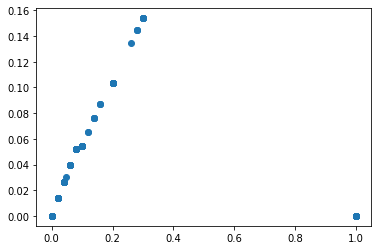

In [202]:
plt.scatter(all_pvals,pvals_corrected-all_pvals)

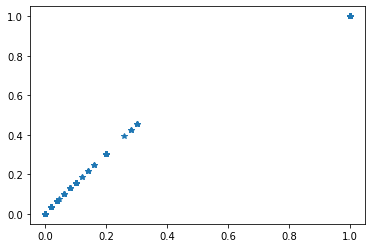

In [196]:
plt.plot(all_pvals, pvals_corrected,'*')

In [174]:
i = 6
pvals = np.array(cvTest_res[i].loc[:,'P-value'].fillna(1))
reject, pvals_corrected, alphacSidak, alphacBonf = multipletests(pvals, alpha=0.01, 
                                                                 method='fdr_bh', 
                                                                 is_sorted=False, 
                                                                 returnsorted=False)

In [175]:
rej0 = pvals<0.01
np.all(reject==rej0)

True

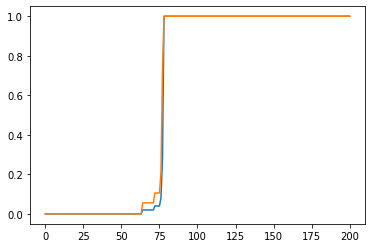

In [176]:
plt.plot(pvals)
plt.plot(pvals_corrected)

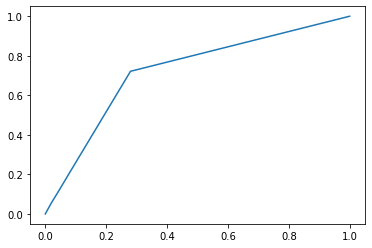

In [177]:
plt.plot(pvals, pvals_corrected)

In [230]:
score_th = 1e4

In [7]:
sol_mm_dir = os.path.join(clustering_dir,'MembMatrix/')
sol_enr_dir = os.path.join(sol_mm_dir, 'Enrich')
prefixes = prefixes = misc.getAll_mm_def(sol_mm_dir).loc[:,'Prefix']

In [152]:
rand_mm_path = {'rna':os.path.join(rand_mm_dir,'rand_rna_50.txt'), 'g2v':os.path.join(rand_mm_dir,'rand_g2v_10.txt')}
rand_mm = {}
for ds in rand_mm_path:
    rand_mm[ds] = loadRandmm(rand_mm_path[ds])

In [159]:
DataSets = list(rand_mm_path.keys())
rand_pref = {ds:rand_mm_path[ds].split('/')[-1].removesuffix('.txt') for ds in DataSets}
rand_pref

{'rna': 'rand_rna_50', 'g2v': 'rand_g2v_10'}

In [160]:
rand_cv_sc1e4 = {ds:enrich.getEnrich_cover(os.path.join(rand_mm_dir,'Enrich',rand_pref[ds]), 
                                           rand_mm[ds], pval=None, score=score_th) 
                 for ds in DataSets}

rand_rna_50_0 not in dir_in_
rand_rna_50_1 not in dir_in_
rand_rna_50_2 not in dir_in_
rand_rna_50_3 not in dir_in_
rand_rna_50_4 not in dir_in_
rand_rna_50_5 not in dir_in_
rand_rna_50_6 not in dir_in_
rand_rna_50_7 not in dir_in_
rand_rna_50_8 not in dir_in_
rand_rna_50_9 not in dir_in_
rand_rna_50_10 not in dir_in_
rand_rna_50_11 not in dir_in_
rand_rna_50_12 not in dir_in_
rand_rna_50_13 not in dir_in_
rand_rna_50_14 not in dir_in_
rand_rna_50_15 not in dir_in_
rand_rna_50_16 not in dir_in_
rand_rna_50_17 not in dir_in_
rand_rna_50_18 not in dir_in_
rand_rna_50_19 not in dir_in_
rand_rna_50_20 not in dir_in_
rand_rna_50_21 not in dir_in_
rand_rna_50_22 not in dir_in_
rand_rna_50_23 not in dir_in_
rand_rna_50_24 not in dir_in_
rand_rna_50_25 not in dir_in_
rand_rna_50_26 not in dir_in_
rand_rna_50_27 not in dir_in_
rand_rna_50_28 not in dir_in_
rand_rna_50_29 not in dir_in_
rand_rna_50_30 not in dir_in_
rand_rna_50_31 not in dir_in_
rand_rna_50_32 not in dir_in_
rand_rna_50_33 not i

In [162]:
cv_res = runCVtest(prefixes, sol_mm_dir, sol_enr_dir, rand_cv_sc1e4, 
                   alpha=None, score_th=score_th)

ICA_rna_3_1e-1
ICA_g2v_10_1e-4
ICA_rna_1e-2
KMeans_g2v_200
KMeans_g2v_200_82 not in dir_in_
KMeans_g2v_200_101 not in dir_in_
KMeans_g2v_200_113 not in dir_in_
KMeans_g2v_200_120 not in dir_in_
KMeans_g2v_200_133 not in dir_in_
KMeans_g2v_200_143 not in dir_in_
KMeans_g2v_200_153 not in dir_in_
KMeans_g2v_200_156 not in dir_in_
KMeans_g2v_200_161 not in dir_in_
KMeans_g2v_200_167 not in dir_in_
KMeans_g2v_200_169 not in dir_in_
KMeans_g2v_200_170 not in dir_in_
KMeans_g2v_200_173 not in dir_in_
KMeans_g2v_200_174 not in dir_in_
KMeans_g2v_200_175 not in dir_in_
KMeans_g2v_200_177 not in dir_in_
KMeans_g2v_200_179 not in dir_in_
KMeans_g2v_200_182 not in dir_in_
KMeans_g2v_200_188 not in dir_in_
SOM_rna_square_letremy_letremy_standard
WGCNA_g2v_ch0.10_recl0
HC_rna_201
HC_rna_201_0 not in dir_in_
KMeans_rna_200
GM_g2v_200_full
GM_g2v_200_full_0 not in dir_in_
GM_g2v_200_full_29 not in dir_in_
GM_g2v_200_full_80 not in dir_in_
GM_g2v_200_full_93 not in dir_in_
GM_g2v_200_full_94 not in di

In [163]:
for sol in cv_res:
    cv_res[sol] = cv_res[sol].dropna(axis=0)

In [164]:
cv_res

{'ICA_rna_3_1e-1':        Cover  # genes  P-value
 95  0.005339     2622     0.00
 90  0.004531     2207     0.00
 72  0.002211     2261     0.00
 91  0.001934     2585     0.00
 77  0.002172     2302     0.04
 ..       ...      ...      ...
 10  0.000386     2594     1.00
 52  0.000384     2601     1.00
 93  0.000380     2631     1.00
 11  0.000379     2640     1.00
 78  0.000378     2646     1.00
 
 [100 rows x 3 columns],
 'ICA_g2v_10_1e-4':         Cover  # genes  P-value
 96   0.022130     1446      0.0
 22   0.004172     2157      0.0
 14   0.003791     1319      0.0
 97   0.002383     2098      0.0
 15   0.012048       83      1.0
 ..        ...      ...      ...
 44   0.000509     1964      1.0
 116  0.000502     1991      1.0
 132  0.000494     2024      1.0
 30   0.000494     2026      1.0
 104  0.000293     3417      1.0
 
 [138 rows x 3 columns],
 'ICA_rna_1e-2':         Cover  # genes  P-value
 20   0.124620      658      0.0
 58   0.005959      839      0.0
 161  0.001938

In [165]:
f = open(os.path.join(rand_mm_dir,'Cover/rand_cv_sc1e4.txt'), 'bw')
pickle.dump(rand_cv_sc1e4, f)
f.close()

In [166]:
f = open(os.path.join(rand_mm_dir,'Cover/cv_sc1e4.txt'), 'bw')
pickle.dump(cv_res, f)
f.close()

In [48]:
import math

In [27]:
all_enr = []
for pref in prefixes:
    print(pref)
    dataset = pref.split('_')[1]
    mm = misc.load_mm(os.path.join(sol_mm_dir,pref+'.csv'))
    directory = os.path.join(sol_enr_dir, pref)
    for i,c in enumerate(mm.columns):
        enr_cl, _, _ = enrich.getEnrich_cl(directory, c, pval=None, score_th=0, mm=mm)
        all_enr.append(enr_cl)

ICA_rna_3_1e-1
ICA_g2v_10_1e-4
ICA_rna_1e-2
KMeans_g2v_200
KMeans_g2v_200_82 not in dir_in_
KMeans_g2v_200_101 not in dir_in_
KMeans_g2v_200_113 not in dir_in_
KMeans_g2v_200_120 not in dir_in_
KMeans_g2v_200_133 not in dir_in_
KMeans_g2v_200_143 not in dir_in_
KMeans_g2v_200_153 not in dir_in_
KMeans_g2v_200_156 not in dir_in_
KMeans_g2v_200_161 not in dir_in_
KMeans_g2v_200_167 not in dir_in_
KMeans_g2v_200_169 not in dir_in_
KMeans_g2v_200_170 not in dir_in_
KMeans_g2v_200_173 not in dir_in_
KMeans_g2v_200_174 not in dir_in_
KMeans_g2v_200_175 not in dir_in_
KMeans_g2v_200_177 not in dir_in_
KMeans_g2v_200_179 not in dir_in_
KMeans_g2v_200_182 not in dir_in_
KMeans_g2v_200_188 not in dir_in_
SOM_rna_square_letremy_letremy_standard
WGCNA_g2v_ch0.10_recl0
HC_rna_201
HC_rna_201_0 not in dir_in_
KMeans_rna_200
GM_g2v_200_full
GM_g2v_200_full_0 not in dir_in_
GM_g2v_200_full_29 not in dir_in_
GM_g2v_200_full_80 not in dir_in_
GM_g2v_200_full_93 not in dir_in_
GM_g2v_200_full_94 not in di

In [29]:
all_enr_df = pd.concat(all_enr)

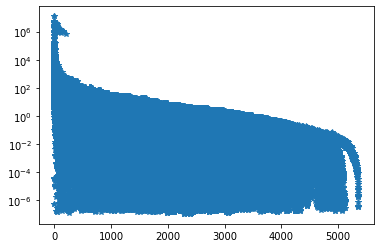

In [34]:
plt.plot(all_enr_df.loc[:,'Combined Score'], '*')
plt.yscale('log')

In [49]:
m = math.floor(np.log10(min(all_enr_df.loc[:,'Combined Score'])))
M = math.ceil(np.log10(max(all_enr_df.loc[:,'Combined Score'])))

In [61]:
b = np.logspace(m,M,100)

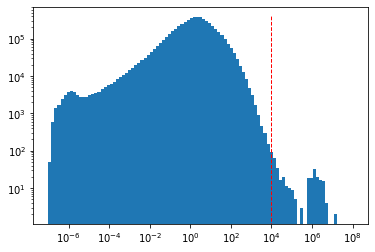

In [82]:
score_th = 1e4
fig, ax = plt.subplots()
ax.hist(all_enr_df.loc[:,'Combined Score'], bins=b)
ax.vlines(score_th, ls='--', ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1], color = 'r', lw=1)
plt.xscale('log')
plt.yscale('log')

In [92]:
keep = all_enr_df.loc[all_enr_df.loc[:,'Combined Score']>score_th,:].sort_values('Combined Score',  ascending=False)
keep

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2021,regulation of transcription by RNA polymerase ...,18/2206,5.484719e-18,1.194825e-16,0,0,320292.000000,1.272987e+07,ZNF264;ZNF154;ZNF550;ZNF75A;ZNF417;ZNF304;ZNF7...
1,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",18/2244,7.467658e-18,1.194825e-16,0,0,319608.000000,1.260405e+07,ZNF264;ZNF154;ZNF550;ZNF75A;ZNF417;ZNF304;ZNF7...
0,GO_Biological_Process_2021,flavonoid glucuronidation (GO:0052696),6/9,9.446528e-22,2.456097e-20,0,0,119946.000000,5.806733e+06,UGT1A10;UGT1A5;UGT1A4;UGT1A3;UGT1A8;UGT1A7
1,GO_Biological_Process_2021,xenobiotic glucuronidation (GO:0052697),6/11,5.195992e-21,6.754790e-20,0,0,119934.000000,5.601685e+06,UGT1A10;UGT1A5;UGT1A4;UGT1A3;UGT1A8;UGT1A7
2,GO_Biological_Process_2021,cellular glucuronidation (GO:0052695),6/19,3.051994e-19,2.645062e-18,0,0,119886.000000,5.111138e+06,UGT1A10;UGT1A5;UGT1A4;UGT1A3;UGT1A8;UGT1A7
...,...,...,...,...,...,...,...,...,...,...
4,GO_Biological_Process_2021,cellular zinc ion homeostasis (GO:0006882),7/28,5.417478e-15,2.385033e-13,0,0,316.682540,1.040275e+04,MT2A;MT1F;MT1G;MT1X;MT1H;MT1HL1;MT1E
0,GO_Biological_Process_2021,synapse pruning (GO:0098883),4/9,1.106304e-09,5.918724e-07,0,0,498.975000,1.028998e+04,C1QB;C1QA;ITGAM;C1QC
18,GO_Biological_Process_2021,regulation of neutrophil degranulation (GO:004...,4/5,1.317680e-08,8.024005e-07,0,0,563.234043,1.021977e+04,ITGAM;SPI1;SYK;ITGB2
5,GO_Biological_Process_2021,regulation of viral genome replication (GO:004...,14/67,3.809769e-25,2.514448e-23,0,0,181.298634,1.019389e+04,IFITM1;RSAD2;MX1;IFIT5;EIF2AK2;ISG15;ZC3HAV1;I...


In [108]:
evOverlap = []
for i in range(all_enr_df.shape[0]):
    evOverlap.append(eval(all_enr_df.iloc[i,2]))

In [112]:
m = math.floor(np.log10(min(evOverlap)))
M = math.ceil(np.log10(max(evOverlap)))

In [113]:
b = np.logspace(m,M,100)

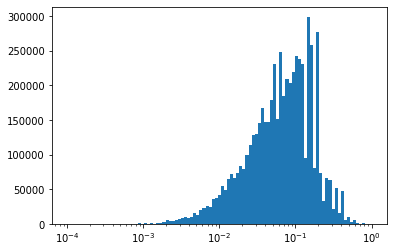

In [117]:
plt.hist(evOverlap, bins=b)
plt.xscale('log')
#plt.yscale('log')

In [127]:
x = pd.concat([all_enr_df,pd.Series(evOverlap, index=all_enr_df.index, name='ovlp')], axis=1)
#keep = all_enr_df.loc[np.array(evOverlap)>0.10,:].sort_values('Combined Score',  ascending=False)
#keep

In [130]:
cScore = x.sort_values('ovlp').loc[:,'Combined Score']

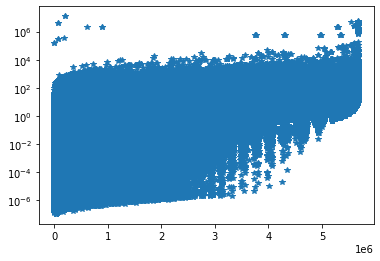

In [135]:
plt.plot([i for i in range(len(cScore))],cScore, '*')
plt.yscale('log')

In [134]:
cScore

118    6.163694e-07
28     2.322190e-03
691    2.406081e-05
71     3.158105e-04
224    1.499411e-03
           ...     
114    8.830057e+05
75     1.658478e+06
55     3.576332e+06
115    1.394553e+06
163    9.683510e+05
Name: Combined Score, Length: 5681561, dtype: float64

In [185]:
cv_ds_ = {ds:[] for ds in DataSets}
for s in cv_res:
    ds = s.split('_')[1]
    sol = pd.Series([s]*cv_res[s].shape[0], index = cv_res[s].index, name='Sol')
    cl = pd.Series(cv_res[s].index, index = cv_res[s].index, name='Cl')
    df = pd.concat([sol, cl, cv_res[s]], axis=1)
    cv_ds_[ds].append(df)

In [186]:
cv_ds = {
    ds:pd.concat(cv_ds_[ds], axis=0).sort_values(['P-value','Cover','# genes'],
                                                 ascending=[True,False,False])
    for ds in DataSets}

In [197]:
alpha

0.01

In [200]:
cv_th = 0.25

In [201]:
keep_cv_ds = {}
for ds in DataSets:
    df = cv_ds[ds]
    cond1 = df.loc[:,'P-value']<=alpha
    cond2 = df.loc[:,'Cover']>=cv_th
    cond = cond1*cond2
    keep_cv_ds[ds] = df.loc[cond,:]

In [207]:
keep_cv_ds

{'rna':                             Sol   Cl     Cover  # genes  P-value
 83   WGCNA_rna_ch0.01_2rcl_rcl0   83  1.000000     18.0      0.0
 106  WGCNA_rna_ch0.01_2rcl_rcl0  106  1.000000     10.0      0.0
 187                 PAM_rna_200  187  1.000000      5.0      0.0
 54   WGCNA_rna_ch0.01_2rcl_rcl0   54  0.862069     29.0      0.0
 35   WGCNA_rna_ch0.01_2rcl_rcl0   35  0.847826     46.0      0.0
 183                 PAM_rna_200  183  0.818182     11.0      0.0
 190                 PAM_rna_200  190  0.750000      4.0      0.0
 130             GM_rna_200_full  130  0.750000      4.0      0.0
 21                   HC_rna_201   21  0.700000     10.0      0.0
 191  WGCNA_rna_ch0.01_2rcl_rcl0  191  0.600000     15.0      0.0
 38   WGCNA_rna_ch0.01_2rcl_rcl0   38  0.534884     43.0      0.0
 40                   HC_rna_201   40  0.400000      5.0      0.0
 119                  HC_rna_201  119  0.250000      8.0      0.0,
 'g2v':                         Sol   Cl     Cover  # genes  P-value

In [221]:
sol_enr_dir

'./MembMatrix/Enrich'

In [229]:
for ds in DataSets:
    saveEnriched_bestCl(keep_cv_ds[ds], ds, sol_enr_dir, ntoAnalyse=None, score_th=score_th, alpha=None, imgDir = './img', dfDir='./bestCl', fpreffix='sc1e4_cv0.25_')

sc1e4_cv0.25_rna_0_WGCNA_rna_ch0.01_2rcl_rcl0_83
sc1e4_cv0.25_rna_1_WGCNA_rna_ch0.01_2rcl_rcl0_106
sc1e4_cv0.25_rna_2_PAM_rna_200_187
sc1e4_cv0.25_rna_3_WGCNA_rna_ch0.01_2rcl_rcl0_54
sc1e4_cv0.25_rna_4_WGCNA_rna_ch0.01_2rcl_rcl0_35
sc1e4_cv0.25_rna_5_PAM_rna_200_183
sc1e4_cv0.25_rna_6_PAM_rna_200_190
sc1e4_cv0.25_rna_7_GM_rna_200_full_130
sc1e4_cv0.25_rna_8_HC_rna_201_21
sc1e4_cv0.25_rna_9_WGCNA_rna_ch0.01_2rcl_rcl0_191
sc1e4_cv0.25_rna_10_WGCNA_rna_ch0.01_2rcl_rcl0_38
sc1e4_cv0.25_rna_11_HC_rna_201_40
sc1e4_cv0.25_rna_12_HC_rna_201_119
sc1e4_cv0.25_g2v_0_HC_g2v_150_136
sc1e4_cv0.25_g2v_1_KMeans_g2v_200_193
sc1e4_cv0.25_g2v_2_GM_g2v_200_full_178
sc1e4_cv0.25_g2v_3_PAM_g2v_200_182
sc1e4_cv0.25_g2v_4_HC_g2v_200_21
sc1e4_cv0.25_g2v_5_HC_g2v_200_140
sc1e4_cv0.25_g2v_6_WGCNA_g2v_ch0.10_recl0_246
sc1e4_cv0.25_g2v_7_WGCNA_g2v_ch0.10_recl0_63
sc1e4_cv0.25_g2v_8_WGCNA_g2v_ch0.10_recl0_385
sc1e4_cv0.25_g2v_9_KMeans_g2v_200_118
sc1e4_cv0.25_g2v_10_KMeans_g2v_200_192
sc1e4_cv0.25_g2v_11_GM_g2v_200

# Using Overlap 

In [21]:
sol_mm_dir = os.path.join(clustering_dir,'MembMatrix')
sol_enr_dir = os.path.join(sol_mm_dir, 'Enrich')
prefixes = prefixes = misc.getAll_mm_def(sol_mm_dir).loc[:,'Prefix']

rand_mm_path = {'rna':os.path.join(rand_mm_dir,'rand_rna_50.txt'), 'g2v':os.path.join(rand_mm_dir,'rand_g2v_10.txt')}
rand_mm = {}
for ds in rand_mm_path:
    rand_mm[ds] = loadRandmm(rand_mm_path[ds])

DataSets = list(rand_mm_path.keys())
rand_pref = {ds:rand_mm_path[ds].split('/')[-1].removesuffix('.txt') for ds in DataSets}
rand_pref

{'rna': 'rand_rna_50', 'g2v': 'rand_g2v_10'}

## Overlap th

In [233]:
all_enr = []
for pref in prefixes:
    print(pref)
    dataset = pref.split('_')[1]
    mm = misc.load_mm(os.path.join(sol_mm_dir,pref+'.csv'))
    directory = os.path.join(sol_enr_dir, pref)
    for i,c in enumerate(mm.columns):
        enr_cl, _, _ = enrich.getEnrich_cl(directory, c, pval=None, score_th=0, mm=mm)
        all_enr.append(enr_cl)

ICA_rna_3_1e-1
ICA_g2v_10_1e-4
ICA_rna_1e-2
KMeans_g2v_200
KMeans_g2v_200_82 not in dir_in_
KMeans_g2v_200_101 not in dir_in_
KMeans_g2v_200_113 not in dir_in_
KMeans_g2v_200_120 not in dir_in_
KMeans_g2v_200_133 not in dir_in_
KMeans_g2v_200_143 not in dir_in_
KMeans_g2v_200_153 not in dir_in_
KMeans_g2v_200_156 not in dir_in_
KMeans_g2v_200_161 not in dir_in_
KMeans_g2v_200_167 not in dir_in_
KMeans_g2v_200_169 not in dir_in_
KMeans_g2v_200_170 not in dir_in_
KMeans_g2v_200_173 not in dir_in_
KMeans_g2v_200_174 not in dir_in_
KMeans_g2v_200_175 not in dir_in_
KMeans_g2v_200_177 not in dir_in_
KMeans_g2v_200_179 not in dir_in_
KMeans_g2v_200_182 not in dir_in_
KMeans_g2v_200_188 not in dir_in_
SOM_rna_square_letremy_letremy_standard
WGCNA_g2v_ch0.10_recl0
HC_rna_201
HC_rna_201_0 not in dir_in_
KMeans_rna_200
GM_g2v_200_full
GM_g2v_200_full_0 not in dir_in_
GM_g2v_200_full_29 not in dir_in_
GM_g2v_200_full_80 not in dir_in_
GM_g2v_200_full_93 not in dir_in_
GM_g2v_200_full_94 not in di

In [234]:
all_enr_df = pd.concat(all_enr)

In [235]:
all_enr_df

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2021,homophilic cell adhesion via plasma membrane a...,19/60,0.000062,0.287169,0,0,3.334566,32.309206,ROBO2;CADM3;CADM1;AMIGO1;AMIGO2;VSTM2L;L1CAM;P...
1,GO_Biological_Process_2021,positive regulation of potassium ion transmemb...,15/44,0.000143,0.287169,0,0,3.718322,32.914825,KCNH2;GABBR2;GABBR1;KCNJ9;AMIGO1;KCNJ15;AKAP6;...
2,GO_Biological_Process_2021,positive regulation of cation transmembrane tr...,14/41,0.000232,0.287169,0,0,3.726400,31.179562,KCNH2;GABBR2;GABBR1;KCNJ9;AMIGO1;KCNJ15;AKAP6;...
3,GO_Biological_Process_2021,organic acid transport (GO:0015849),25/100,0.000344,0.287169,0,0,2.399808,19.139950,SLC46A1;SLC43A1;SLC3A1;ABCC11;SLC25A29;RXRA;PD...
4,GO_Biological_Process_2021,positive regulation of potassium ion transport...,13/38,0.000378,0.287169,0,0,3.735941,29.440740,KCNH2;GABBR2;GABBR1;KCNJ9;AMIGO1;KCNJ15;AKAP6;...
...,...,...,...,...,...,...,...,...,...,...
158,GO_Biological_Process_2021,regulation of cell population proliferation (G...,1/764,0.420426,0.431003,0,0,1.937998,1.679249,FGF1
159,GO_Biological_Process_2021,regulation of transcription by RNA polymerase ...,2/2206,0.467369,0.476132,0,0,1.344676,1.022809,ETV1;FGF1
160,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",2/2244,0.476714,0.482636,0,0,1.319060,0.977210,ETV1;CDK15
161,GO_Biological_Process_2021,cellular protein modification process (GO:0006...,1/1025,0.521349,0.524567,0,0,1.424429,0.927781,CDK15


In [236]:
all_enr_df.to_csv(os.path.join(sol_mm_dir,'Enrich/all_enr.csv'), header=True)

In [248]:
import time

In [323]:
nrep = 100

In [320]:
n_test = 10000
test_df = all_enr_df.iloc[:n_test,:]
overlap_str = test_df.loc[:,'Overlap'].tolist()

In [324]:
time_eval_ = []
for j in range(nrep):
    start_eval = time.time()
    overlap_eval = []
    for i in range(len(overlap_str)):
        overlap_eval.append(eval(overlap_str[i]))
    stop_eval = time.time()
    time_eval_.append(stop_eval-start_eval)

In [327]:
time_hand_ = []
for j in range(nrep):
    start_hand = time.time()
    overlap_hand = []
    for i in range(len(overlap_str)):
        sp = overlap_str[i].split('/')
        overlap_hand.append(int(sp[0])/int(sp[1]))
    stop_hand = time.time()
    time_hand_.append(stop_hand-start_hand)

In [330]:
time_eval_mean = np.mean(time_eval_)
time_eval_std = np.std(time_eval_)

In [331]:
time_hand_mean = np.mean(time_hand_)
time_hand_std = np.std(time_hand_)

In [333]:
print(time_eval_mean-2*time_eval_std, time_eval_mean+2*time_eval_std)
print(time_hand_mean-2*time_hand_std, time_hand_mean+2*time_hand_std)

0.03746422077708312 0.06913580630726746
0.007483931699037817 0.009045103869199487


In [334]:
overlap_str = all_enr_df.loc[:,'Overlap'].tolist()

In [335]:
overlap_num = []
for i in range(len(overlap_str)):
    sp = overlap_str[i].split('/')
    overlap_num.append(int(sp[0])/int(sp[1]))

In [337]:
len(overlap_num)==all_enr_df.shape[0]

True

In [339]:
overlap_num_serie = pd.Series(overlap_num, index=all_enr_df.index, name='Overlap Num')

In [340]:
all_enr_ovlp = pd.concat([all_enr_df, overlap_num_serie], axis=1)

In [342]:
all_enr_ovlp.sort_values('Overlap Num', ascending=False)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Overlap Num
0,GO_Biological_Process_2021,excitatory chemical synaptic transmission (GO:...,7/7,3.141485e-07,0.001331,0,0,123494.000000,1.849125e+06,GRIN2A;GRIN2C;GRIN2B;PDLIM4;GRIN1;GRIN2D;SHISA6,1.000000
0,GO_Biological_Process_2021,establishment of protein localization to telom...,5/5,3.933909e-05,0.188080,0,0,86840.000000,8.808435e+05,ACD;TERT;NABP2;POT1;BRCA2,1.000000
145,GO_Biological_Process_2021,regulation of microglial cell mediated cytotox...,5/5,5.508431e-06,0.000158,0,0,91115.000000,1.103333e+06,CX3CR1;ITGAM;SPI1;TYROBP;STAP1,1.000000
85,GO_Biological_Process_2021,negative regulation of myeloid leukocyte media...,6/6,3.740742e-07,0.000019,0,0,109800.000000,1.624910e+06,CX3CR1;CD84;SPI1;CD300A;LGALS9;CCR2,1.000000
117,GO_Biological_Process_2021,regulation of microglial cell mediated cytotox...,5/5,4.412893e-06,0.000160,0,0,91500.000000,1.128285e+06,CX3CR1;ITGAM;SPI1;TYROBP;STAP1,1.000000
...,...,...,...,...,...,...,...,...,...,...,...
66,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",1/2244,9.940401e-01,0.994040,0,0,0.188035,1.124018e-03,ZFP2,0.000446
148,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",1/2244,7.300291e-01,0.730029,0,0,0.791173,2.489590e-01,KMT2D,0.000446
85,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",1/2244,7.603363e-01,0.760336,0,0,0.719207,1.970587e-01,PAX5,0.000446
65,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",1/2244,8.111293e-01,0.811129,0,0,0.608491,1.273741e-01,EN1,0.000446


In [343]:
m = math.floor(np.log10(min(overlap_num)))
M = math.ceil(np.log10(max(overlap_num)))

In [344]:
b = np.logspace(m,M,100)

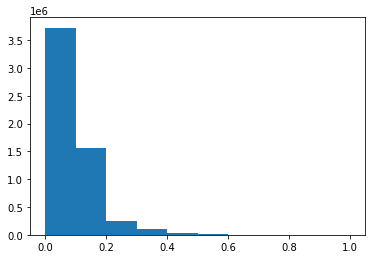

In [346]:
plt.hist(overlap_num);

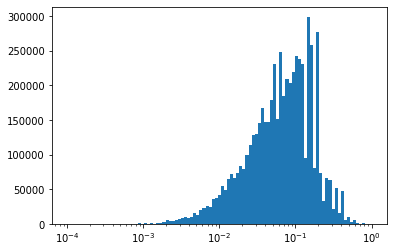

In [347]:
plt.hist(overlap_num, bins=b)
plt.xscale('log')

In [358]:
ovlp_th = 0.25

In [359]:
all_enr_ovlp.loc[all_enr_ovlp.loc[:,'Overlap Num']>=ovlp_th,:].sort_values('Overlap Num', ascending=False)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Overlap Num
73,GO_Biological_Process_2021,negative regulation of B cell receptor signali...,6/6,5.051552e-06,3.369332e-04,0,0,104268.000000,1.271633e+06,CD300A;FCRL3;GPS2;LPXN;FCGR2B;CD22,1.00
13,GO_Biological_Process_2021,"antigen processing and presentation, endogenou...",5/5,1.238673e-06,1.971967e-04,0,0,93405.000000,1.270445e+06,CD1E;CD1D;CD1C;CD1B;CD1A,1.00
163,GO_Biological_Process_2021,regulation of microglial cell mediated cytotox...,5/5,1.818912e-05,4.939898e-04,0,0,88720.000000,9.683510e+05,CX3CR1;ITGAM;SPI1;TYROBP;STAP1,1.00
57,GO_Biological_Process_2021,negative regulation of leukocyte degranulation...,9/9,4.181201e-10,3.074624e-08,0,0,163629.000000,3.533610e+06,CD84;CEACAM1;SPI1;CD300A;NCKAP1L;LGALS9;FCGR2B...,1.00
55,GO_Biological_Process_2021,negative regulation of leukocyte degranulation...,9/9,3.386787e-10,2.535252e-08,0,0,164007.000000,3.576332e+06,CD84;CEACAM1;SPI1;CD300A;NCKAP1L;LGALS9;FCGR2B...,1.00
...,...,...,...,...,...,...,...,...,...,...,...
335,GO_Biological_Process_2021,regulation of Rac protein signal transduction ...,4/16,5.908326e-03,6.110546e-02,0,0,6.678596,3.427050e+01,SH3BP1;RASGRF1;STMN3;PIK3CG,0.25
276,GO_Biological_Process_2021,negative regulation of long-term synaptic pote...,2/8,3.552307e-02,3.699474e-01,0,0,8.343750,2.784787e+01,EPHA4;PTN,0.25
277,GO_Biological_Process_2021,negative regulation of striated muscle cell ap...,2/8,3.552307e-02,3.699474e-01,0,0,8.343750,2.784787e+01,MDK;BMP7,0.25
278,GO_Biological_Process_2021,positive regulation of monocyte chemotactic pr...,2/8,3.552307e-02,3.699474e-01,0,0,8.343750,2.784787e+01,ADIPOQ;TWIST1,0.25


## Get Cover

In [23]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [12]:
def runBestClEval(randDir, rand_pref, rand_mm, DataSets, prefixes, sol_mm_dir, sol_enr_dir, alpha = 0.05, ovlp_th = 0.25, score_th = 1e3 ,cv_th = 0.25, save=True):
    
    fprefix = 'a'+str(alpha)+'_o'+str(ovlp_th)+'_s'+str(score_th)
    
    rand_cv = {ds:enrich.getEnrich_cover(os.path.join(randDir, 'Enrich',rand_pref[ds]), 
                                         rand_mm[ds], pval=alpha, score=score_th, ovlp_th=ovlp_th)
               for ds in DataSets}
    f = open(os.path.join(randDir,'Cover',fprefix+'_rand_cv.txt'), 'bw')
    pickle.dump(rand_cv, f)
    f.close()
    
    cv_res = runCVtest(prefixes, sol_mm_dir, sol_enr_dir, rand_cv, 
                   alpha=alpha, score_th=score_th, ovlp_th=ovlp_th)
    for sol in cv_res:
        cv_res[sol] = cv_res[sol].dropna(axis=0)
    f = open(os.path.join(randDir,'Cover',fprefix+'_cv.txt'), 'bw')
    pickle.dump(cv_res, f)
    f.close()
    
    cv_ds_ = {ds:[] for ds in DataSets}
    for s in cv_res:
        ds = s.split('_')[1]
        sol = pd.Series([s]*cv_res[s].shape[0], index = cv_res[s].index, name='Sol')
        cl = pd.Series(cv_res[s].index, index = cv_res[s].index, name='Cl')
        df = pd.concat([sol, cl, cv_res[s]], axis=1)
        cv_ds_[ds].append(df)
    cv_ds = {
        ds:pd.concat(cv_ds_[ds], axis=0).sort_values(['P-value','Cover','# genes'],
                                                     ascending=[True,False,False]) 
        for ds in DataSets}
    keep_cv_ds = {}
    for ds in DataSets:
        df = cv_ds[ds]
        cond1 = df.loc[:,'P-value']<=alpha
        cond2 = df.loc[:,'Cover']>=cv_th
        cond = cond1*cond2
        keep_cv_ds[ds] = df.loc[cond,:]
    
    if save:
        for ds in DataSets:
            saveEnriched_bestCl(keep_cv_ds[ds], ds, sol_enr_dir, ntoAnalyse=None, score_th=score_th, alpha=alpha, ovlp_th=ovlp_th, imgDir = './img', dfDir='./bestCl', fpreffix=fprefix+'_')
    return keep_cv_ds

In [27]:
alpha = 0.05
ovlp_th = 0.25
score_th = 1e3
cv_th = 0.25

In [28]:
rand_cv_a005_ovlp025 = {ds:enrich.getEnrich_cover(os.path.join(rand_mm_dir,'Enrich',rand_pref[ds]), 
                                           rand_mm[ds], pval=alpha, score=score_th, ovlp_th=ovlp_th) 
                 for ds in DataSets}

rand_rna_50_0 not in dir_in_
rand_rna_50_1 not in dir_in_
rand_rna_50_2 not in dir_in_
rand_rna_50_3 not in dir_in_
rand_rna_50_4 not in dir_in_
rand_rna_50_5 not in dir_in_
rand_rna_50_6 not in dir_in_
rand_rna_50_7 not in dir_in_
rand_rna_50_8 not in dir_in_
rand_rna_50_9 not in dir_in_
rand_rna_50_10 not in dir_in_
rand_rna_50_11 not in dir_in_
rand_rna_50_12 not in dir_in_
rand_rna_50_13 not in dir_in_
rand_rna_50_14 not in dir_in_
rand_rna_50_15 not in dir_in_
rand_rna_50_16 not in dir_in_
rand_rna_50_17 not in dir_in_
rand_rna_50_18 not in dir_in_
rand_rna_50_19 not in dir_in_
rand_rna_50_20 not in dir_in_
rand_rna_50_21 not in dir_in_
rand_rna_50_22 not in dir_in_
rand_rna_50_23 not in dir_in_
rand_rna_50_24 not in dir_in_
rand_rna_50_25 not in dir_in_
rand_rna_50_26 not in dir_in_
rand_rna_50_27 not in dir_in_
rand_rna_50_28 not in dir_in_
rand_rna_50_29 not in dir_in_
rand_rna_50_30 not in dir_in_
rand_rna_50_31 not in dir_in_
rand_rna_50_32 not in dir_in_
rand_rna_50_33 not i

In [29]:
cv_res = runCVtest(prefixes, sol_mm_dir, sol_enr_dir, rand_cv_a005_ovlp025, 
                   alpha=alpha, score_th=score_th, ovlp_th=ovlp_th)

ICA_rna_1e-2
KMeans_g2v_200
KMeans_g2v_200_82 not in dir_in_
KMeans_g2v_200_101 not in dir_in_
KMeans_g2v_200_113 not in dir_in_
KMeans_g2v_200_120 not in dir_in_
KMeans_g2v_200_133 not in dir_in_
KMeans_g2v_200_143 not in dir_in_
KMeans_g2v_200_153 not in dir_in_
KMeans_g2v_200_156 not in dir_in_
KMeans_g2v_200_161 not in dir_in_
KMeans_g2v_200_167 not in dir_in_
KMeans_g2v_200_169 not in dir_in_
KMeans_g2v_200_170 not in dir_in_
KMeans_g2v_200_173 not in dir_in_
KMeans_g2v_200_174 not in dir_in_
KMeans_g2v_200_175 not in dir_in_
KMeans_g2v_200_177 not in dir_in_
KMeans_g2v_200_179 not in dir_in_
KMeans_g2v_200_182 not in dir_in_
KMeans_g2v_200_188 not in dir_in_
SOM_rna_square_letremy_letremy_standard
WGCNA_g2v_ch0.10_recl0
HC_rna_201
HC_rna_201_0 not in dir_in_
KMeans_rna_200
GM_g2v_200_full
GM_g2v_200_full_0 not in dir_in_
GM_g2v_200_full_29 not in dir_in_
GM_g2v_200_full_80 not in dir_in_
GM_g2v_200_full_93 not in dir_in_
GM_g2v_200_full_94 not in dir_in_
GM_g2v_200_full_108 not i

In [30]:
for sol in cv_res:
    cv_res[sol] = cv_res[sol].dropna(axis=0)

In [31]:
f = open(os.path.join(rand_mm_dir,'Cover/rand_cv_a005_ovlp025.txt'), 'bw')
pickle.dump(rand_cv_a005_ovlp025, f)
f.close()

In [32]:
f = open(os.path.join(rand_mm_dir,'Cover/cv_a005_ovlp025.txt'), 'bw')
pickle.dump(cv_res, f)
f.close()

In [33]:
f = open(os.path.join(rand_mm_dir,'rand_cv_a005_ovlp025.txt'), 'br')
rand_cv_a005_ovlp025 = pickle.load(f)
f.close()

In [34]:
f = open(os.path.join(rand_mm_dir,'cv_a005_ovlp025.txt'), 'br')
cv_a005_ovlp025 = pickle.load(f)
f.close()

In [35]:
cv_ds_ = {ds:[] for ds in DataSets}
for s in cv_res:
    ds = s.split('_')[1]
    sol = pd.Series([s]*cv_res[s].shape[0], index = cv_res[s].index, name='Sol')
    cl = pd.Series(cv_res[s].index, index = cv_res[s].index, name='Cl')
    df = pd.concat([sol, cl, cv_res[s]], axis=1)
    cv_ds_[ds].append(df)
cv_ds = {
    ds:pd.concat(cv_ds_[ds], axis=0).sort_values(['P-value','Cover','# genes'],
                                                 ascending=[True,False,False])
    for ds in DataSets}

In [36]:
keep_cv_ds = {}
for ds in DataSets:
    df = cv_ds[ds]
    cond1 = df.loc[:,'P-value']<=alpha
    cond2 = df.loc[:,'Cover']>=cv_th
    cond = cond1*cond2
    keep_cv_ds[ds] = df.loc[cond,:]

In [104]:
cv_ds_bis = {}
for ds in DataSets:
    cv_ds_bis[ds] = cv_ds[ds]
    for i in range(cv_ds_bis[ds].shape[0]):
        cv_ds_bis[ds].iloc[i,0] = '_'.join(cv_ds_bis[ds].iloc[i,0].split('_')[:2])
    med = cv_ds_bis[ds].groupby('Sol').median().sort_values('Cover', ascending=False)
    med_rank = {sol:i for i,sol in enumerate(med.index)}
    cv_ds_bis[ds].index = [i for i in range(cv_ds_bis[ds].shape[0])]
    rank = pd.Series([med_rank[s] for s in cv_ds_bis[ds].loc[:,'Sol']], name='Rank')
    cv_ds_bis[ds] = pd.concat([cv_ds_bis[ds], rank], axis=1).sort_values('Rank')

In [106]:
cv_ds_bis['rna']

,Sol,Cl,Cover,# genes,P-value,Rank
0,WGCNA_rna,35,0.739130,46.0,0.0,0
442,WGCNA_rna,82,0.055556,18.0,1.0,0
441,WGCNA_rna,81,0.055556,18.0,1.0,0
440,WGCNA_rna,80,0.055556,18.0,1.0,0
435,WGCNA_rna,187,0.058824,17.0,1.0,0
...,...,...,...,...,...,...
138,FLAME_rna,81,0.022556,399.0,0.0,7
135,FLAME_rna,169,0.029677,1887.0,0.0,7
131,FLAME_rna,107,0.033715,1483.0,0.0,7
327,FLAME_rna,179,0.166667,6.0,1.0,7


In [128]:
methods = ["WGCNA", "HC", "SOM", 'KMeans', 'GM', 'PAM', 'ICA', 'FLAME']
Palette = {}
for ds in DataSets:
    Palette[ds] = {}
    for i,s in enumerate(methods):
        Palette[ds][s+'_'+ds] = sns.color_palette()[i]

In [129]:
Palette['rna']

{'WGCNA_rna': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 'HC_rna': (1.0, 0.4980392156862745, 0.054901960784313725),
 'SOM_rna': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 'KMeans_rna': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 'GM_rna': (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 'PAM_rna': (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 'ICA_rna': (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 'FLAME_rna': (0.4980392156862745, 0.4980392156862745, 0.4980392156862745)}

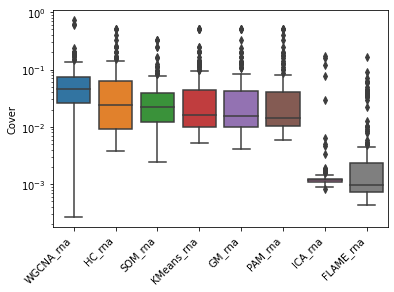

In [132]:
g = sns.boxplot(x='Sol', y='Cover', data=cv_ds_bis['rna'], showfliers=True, 
                palette = Palette['rna'])
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cover')
g.set_yscale('log')
plt.xlabel("Sol", visible=False);

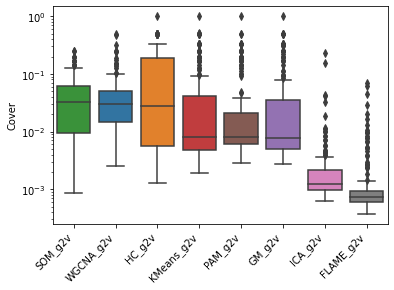

In [134]:
g = sns.boxplot(x='Sol', y='Cover', data=cv_ds_bis['g2v'], showfliers=True,
                palette = Palette['g2v'])
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cover')
g.set_yscale('log')
plt.xlabel("Sol", visible=False);

In [145]:
cv_ds_all = pd.concat([cv_ds_bis['rna'], cv_ds_bis['g2v']])
med = cv_ds_all.groupby('Sol').median().sort_values('Cover', ascending=False)
med_rank = {sol:i for i,sol in enumerate(med.index)}
cv_ds_all.index = [i for i in range(cv_ds_all.shape[0])]
rank = pd.Series([med_rank[s] for s in cv_ds_all.loc[:,'Sol']], name='Rank_all')
cv_ds_all = pd.concat([cv_ds_all, rank], axis=1).sort_values('Rank_all')

In [146]:
cv_ds_all

,Sol,Cl,Cover,# genes,P-value,Rank,Rank_all
0,WGCNA_rna,35,0.739130,46.0,0.0,0,0
125,WGCNA_rna,58,0.038462,26.0,1.0,0,0
126,WGCNA_rna,163,0.040000,25.0,1.0,0,0
127,WGCNA_rna,162,0.040000,25.0,1.0,0,0
128,WGCNA_rna,161,0.040000,25.0,1.0,0,0
...,...,...,...,...,...,...,...
3231,FLAME_g2v,152,0.000521,1920.0,1.0,7,15
3232,FLAME_g2v,64,0.000598,1672.0,1.0,7,15
3233,FLAME_g2v,200,0.000401,2491.0,1.0,7,15
3211,FLAME_g2v,138,0.000612,1634.0,1.0,7,15


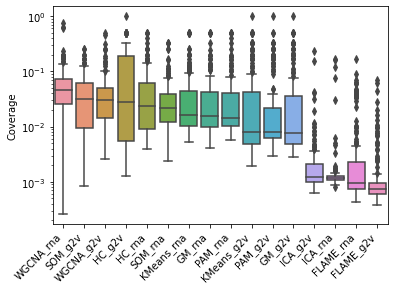

In [148]:
g = sns.boxplot(x='Sol', y='Cover', data=cv_ds_all, showfliers=True)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Coverage')
g.set_yscale('log')
plt.xlabel("Sol", visible=False);

In [37]:
keep_cv_ds

{'rna':                             Sol   Cl     Cover  # genes  P-value
 35   WGCNA_rna_ch0.01_2rcl_rcl0   35  0.739130     46.0      0.0
 38   WGCNA_rna_ch0.01_2rcl_rcl0   38  0.627907     43.0      0.0
 191  WGCNA_rna_ch0.01_2rcl_rcl0  191  0.600000     15.0      0.0
 190                 PAM_rna_200  190  0.500000      4.0      0.0
 130             GM_rna_200_full  130  0.500000      4.0      0.0
 40                   HC_rna_201   40  0.400000      5.0      0.0
 187                 PAM_rna_200  187  0.400000      5.0      0.0
 11                   HC_rna_201   11  0.259259     27.0      0.0
 119                  HC_rna_201  119  0.250000      8.0      0.0,
 'g2v':                         Sol   Cl     Cover  # genes  P-value
 193          KMeans_g2v_200  193  1.000000      4.0      0.0
 178         GM_g2v_200_full  178  1.000000      4.0      0.0
 182             PAM_g2v_200  182  1.000000      4.0      0.0
 21               HC_g2v_200   21  1.000000      4.0      0.0
 190          K

In [149]:
tSNE = {'rna':pd.read_csv(os.path.join(doc,'data/RNAseq_tSNE.csv'),index_col=0),
        'g2v':pd.read_csv(os.path.join(doc,'data/gene2vec_tSNE.csv'), index_col=0)}

In [161]:
reload(misc)

<module 'clusterian.misc' from '/home/ldap/ipellet/Documents/Clustering/clusterian/misc.py'>

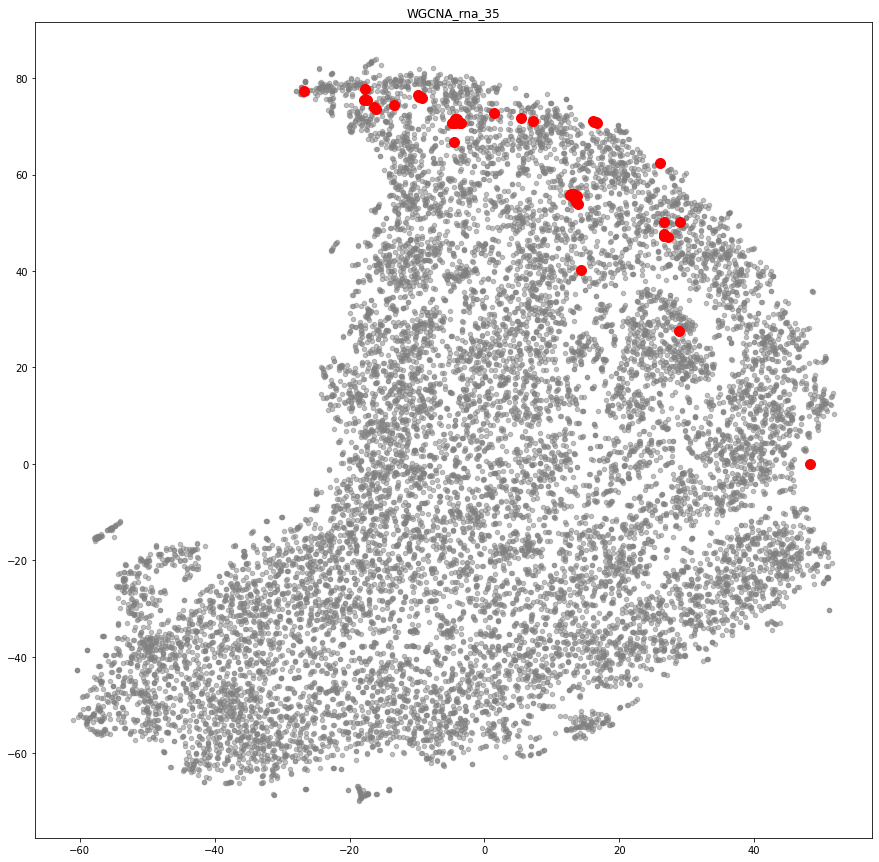

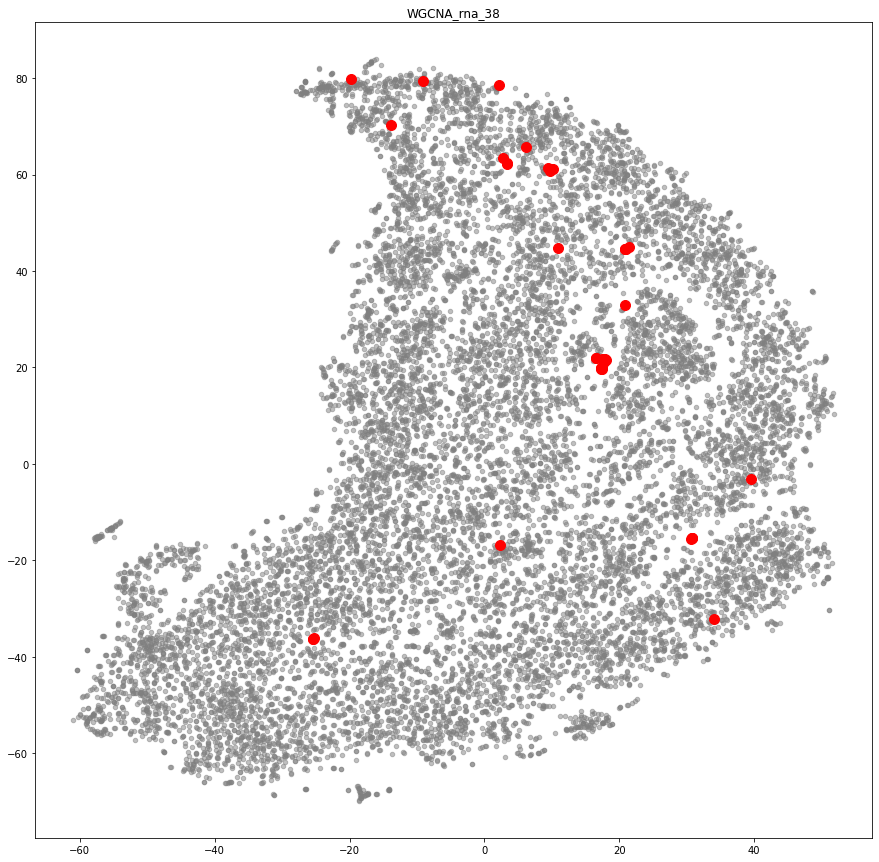

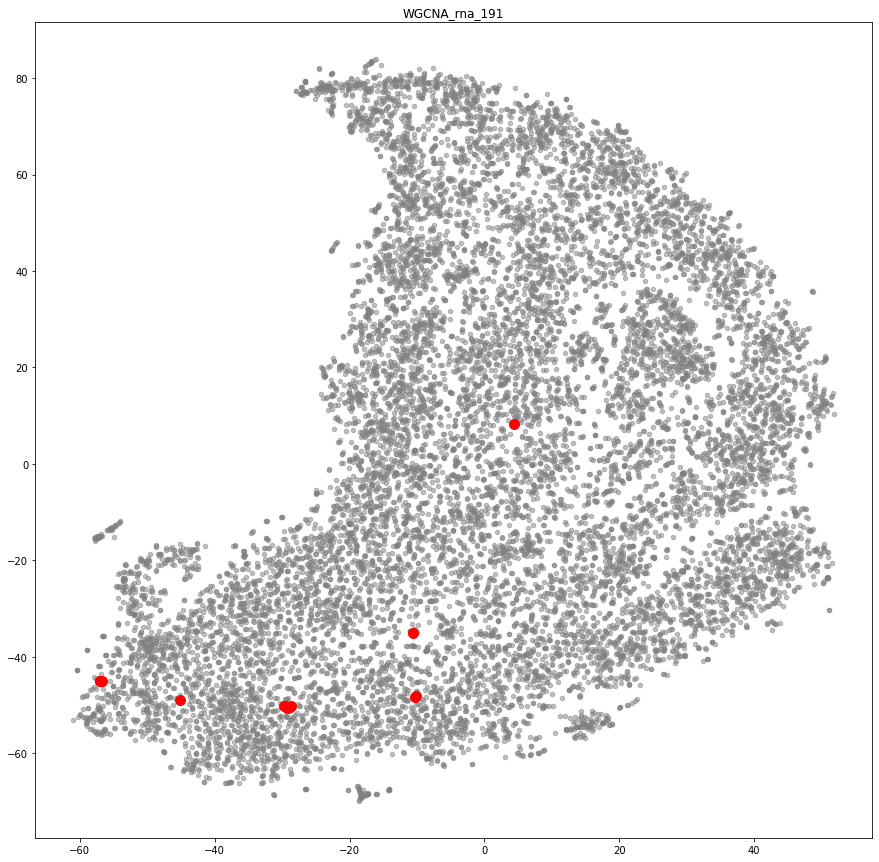

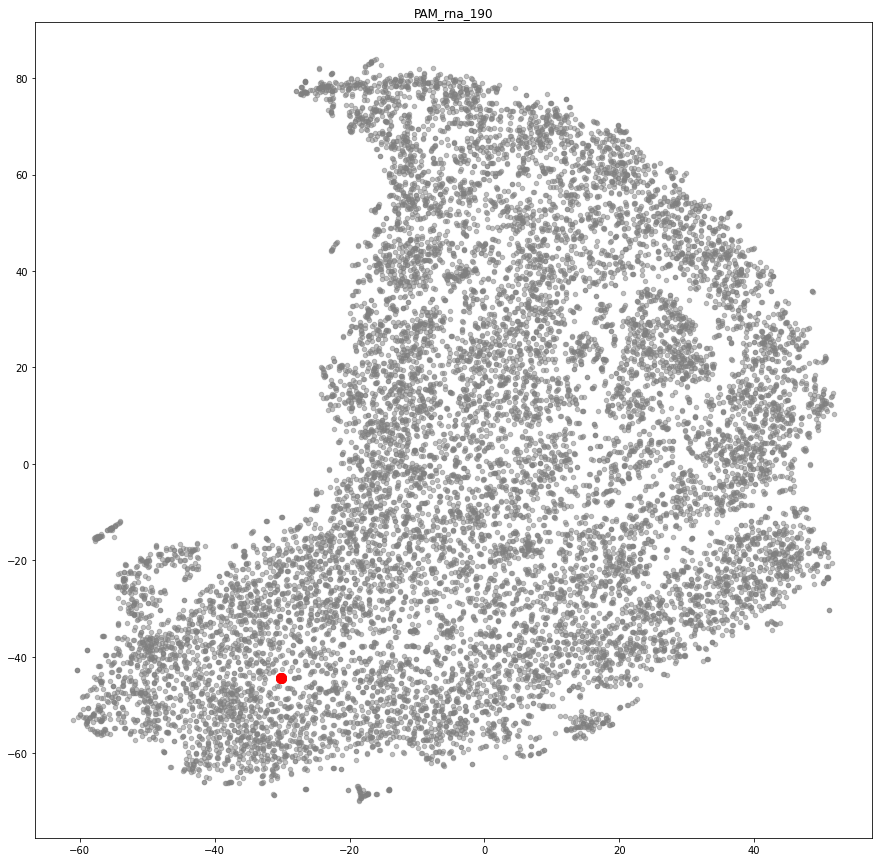

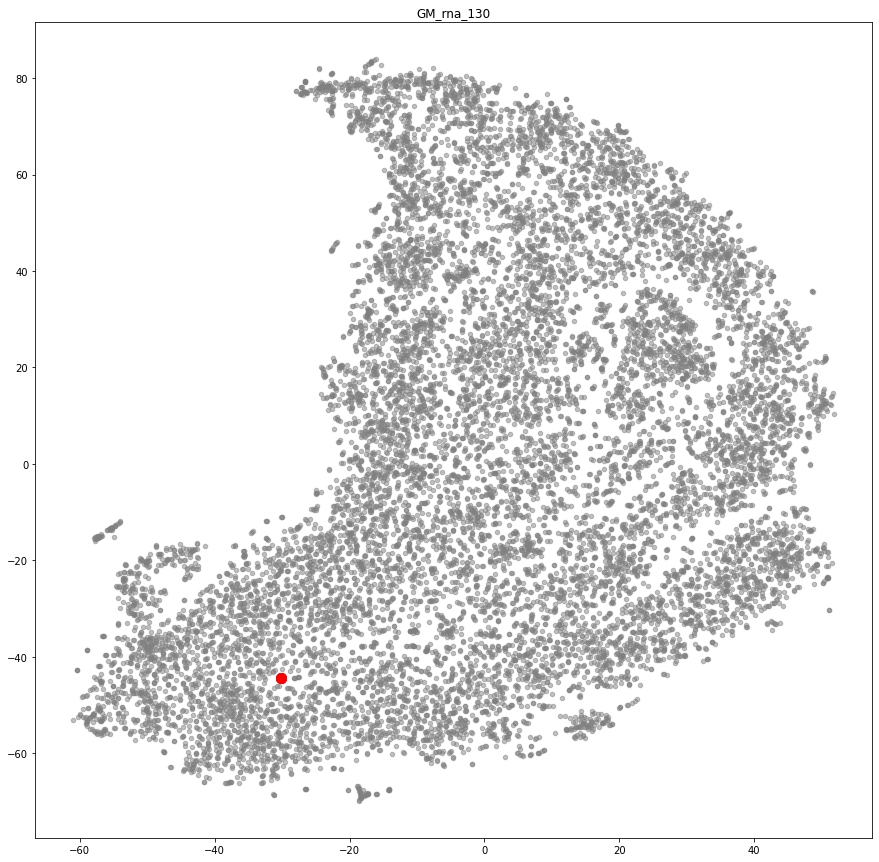

...

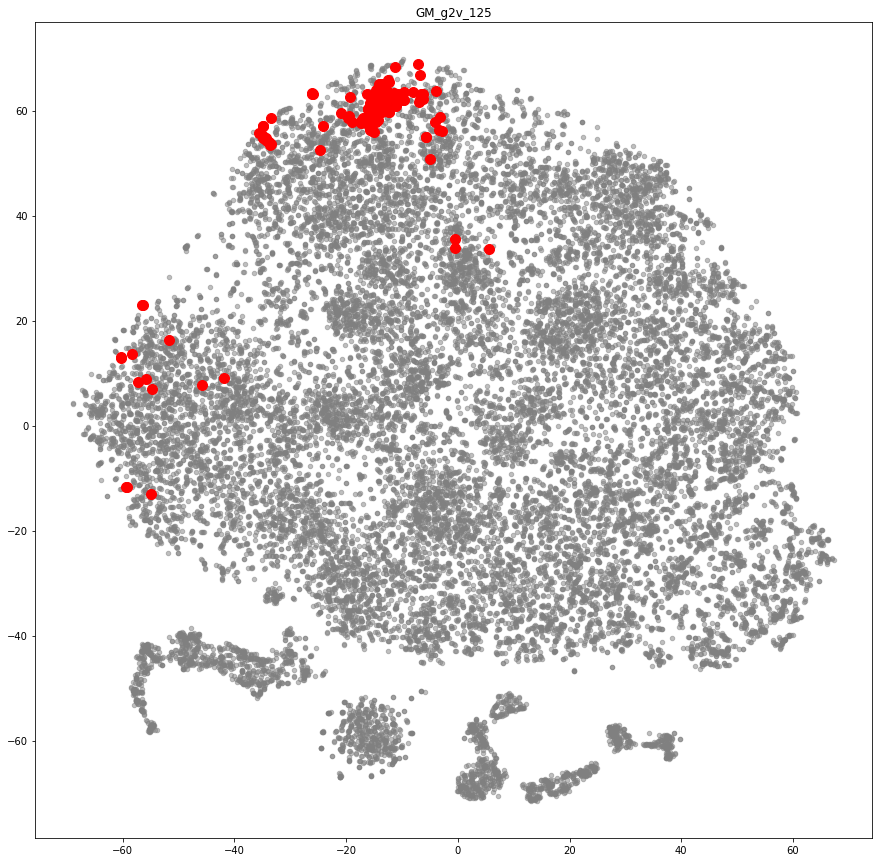

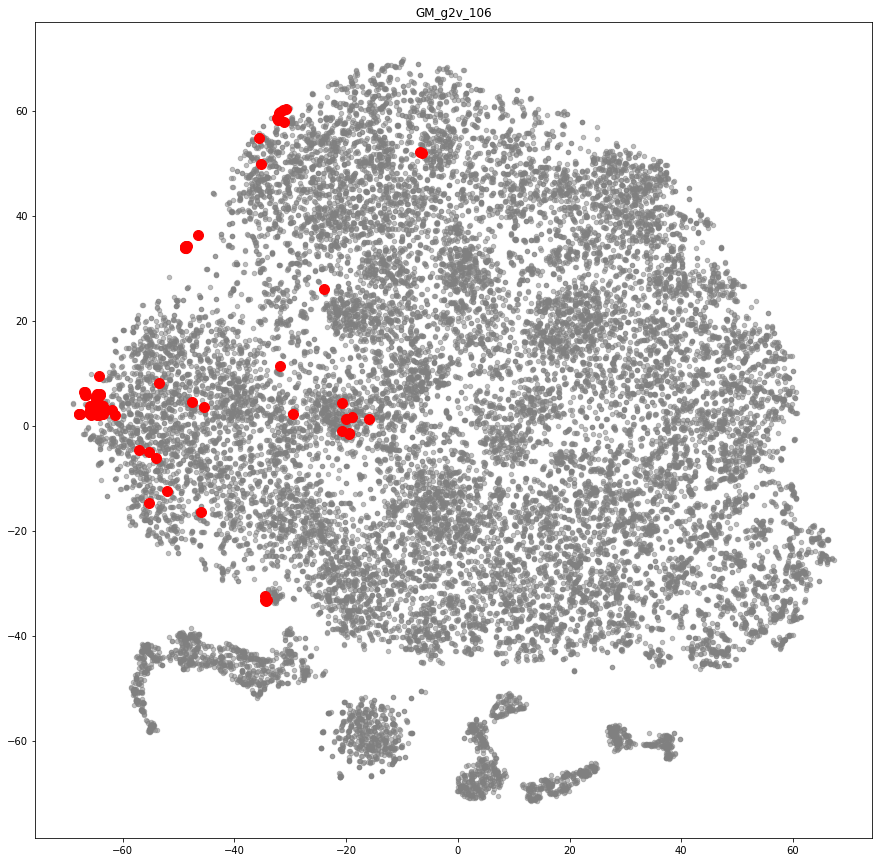

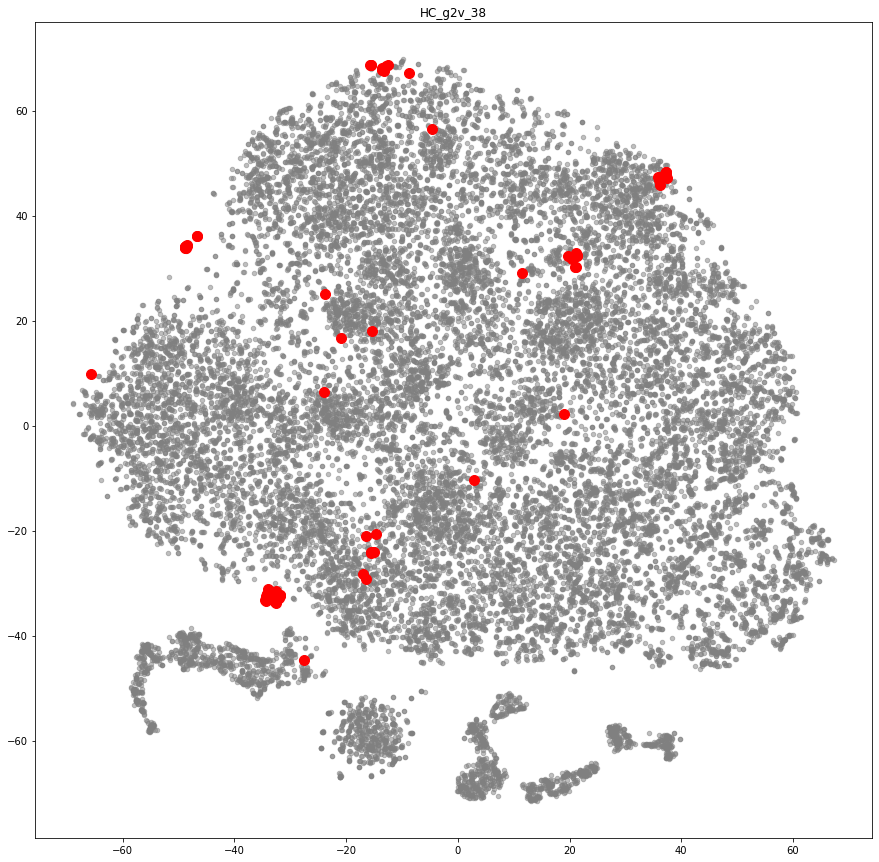

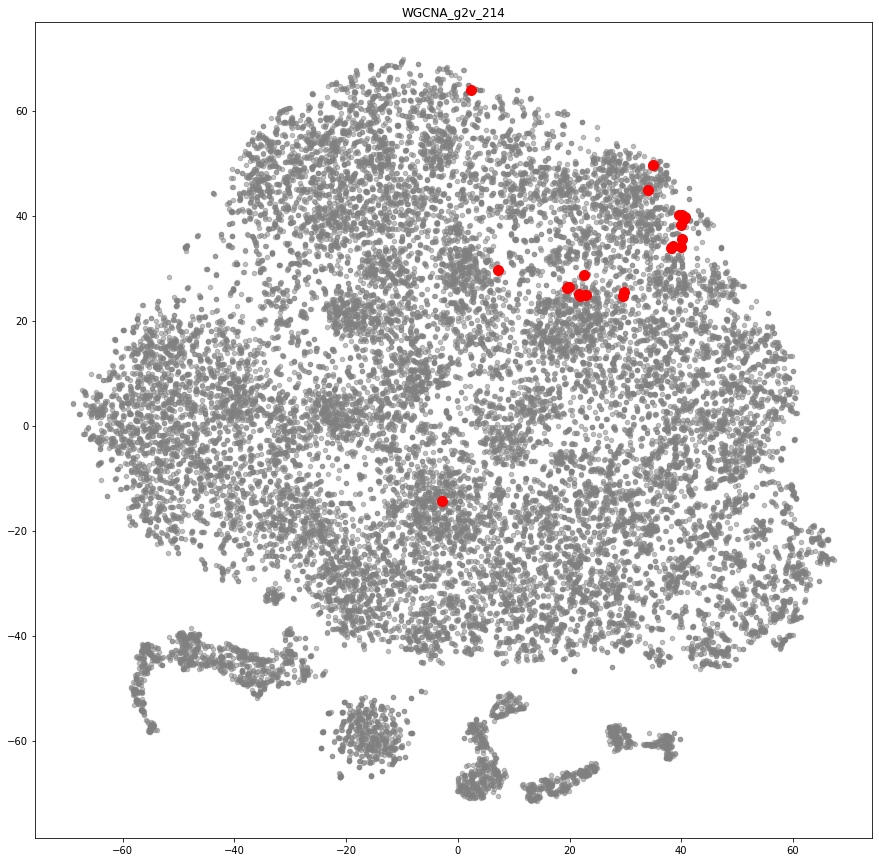

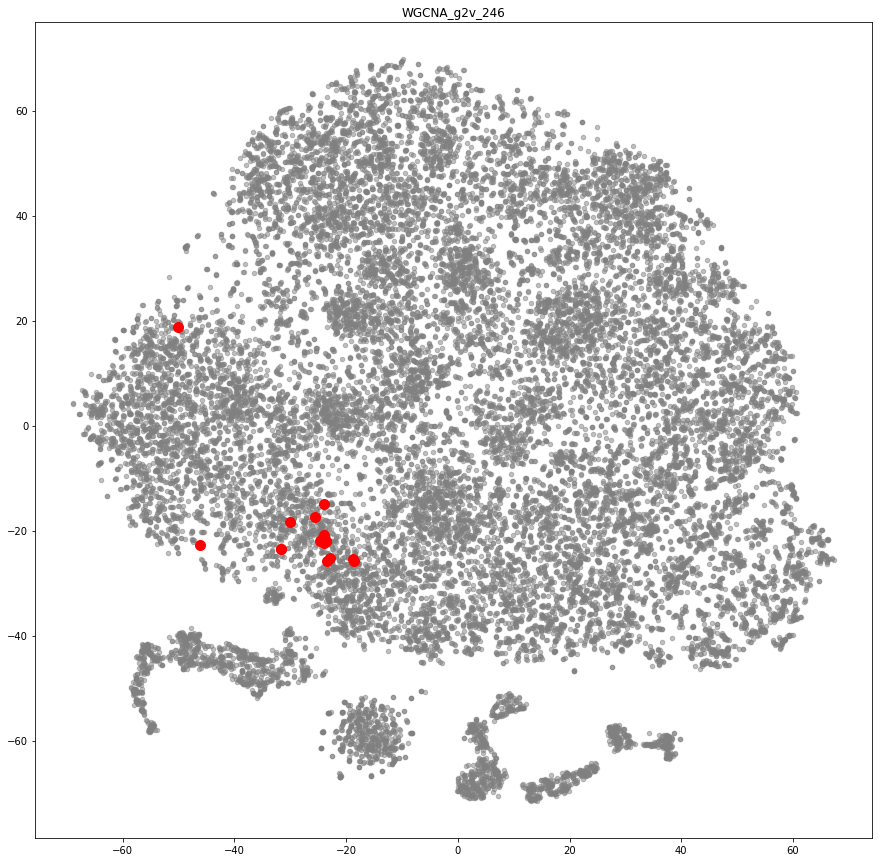

In [187]:
plt.rcParams['figure.figsize'] = 15,15
fprefix = os.path.join(doc,'/img/PlotCl_')
for ds in keep_cv_ds:
    tsne = tSNE[ds]
    df = keep_cv_ds[ds]
    for i in range(df.shape[0]):
        sol = '_'.join(df.iat[i,0].split('_')[:2])
        cl = df.iat[i,1]
        tt = sol+'_'+str(cl)
        fname = fprefix+tt+'.png'
        misc.plotCl(mm_dict[sol], tsne, cl=cl, title=tt, save=True, fname=fname, scl=100)

In [190]:
reload(misc)

<module 'clusterian.misc' from '/home/ldap/ipellet/Documents/Clustering/clusterian/misc.py'>

Plot best clusters

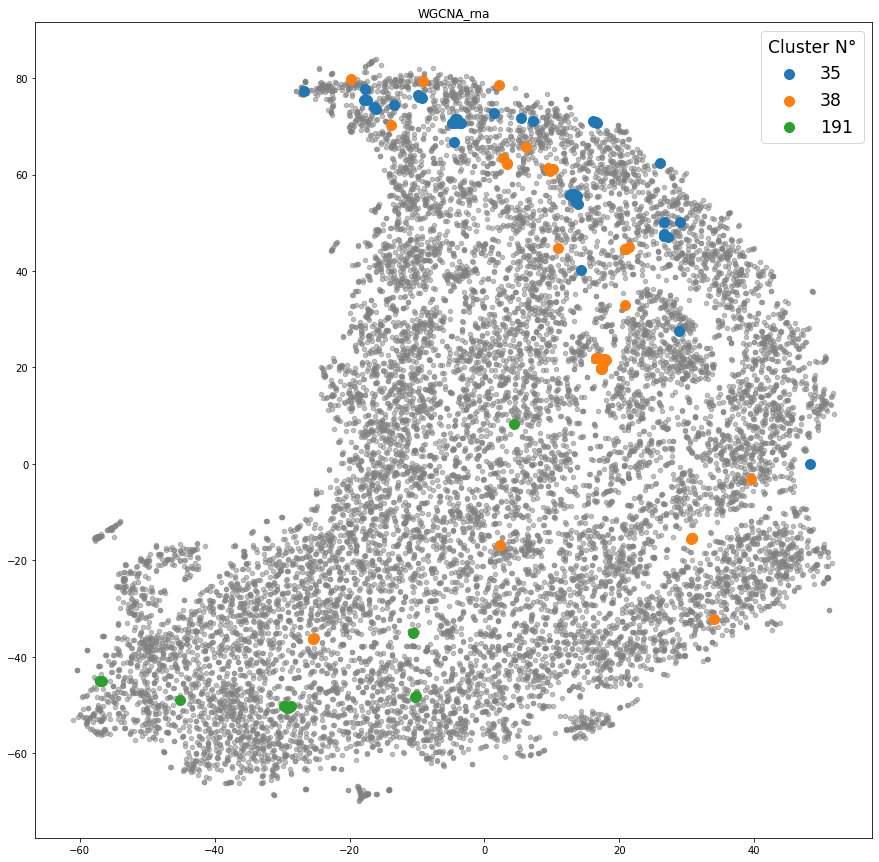

In [191]:
sol = 'WGCNA_rna'
cl_ = [35,38,191]
fname = fprefix+'_'.join([sol]+[str(cl) for cl in cl_])+'.png'
#tt = sol+'_'+str(cl)
#fname = fprefix+tt+'.png'
misc.plotCls(mm_dict[sol], tSNE['rna'], cl_=cl_, title=sol, save=True, fname=fname, scl=100)

In [42]:
for ds in DataSets:
    saveEnriched_bestCl(keep_cv_ds[ds], ds, sol_enr_dir, ntoAnalyse=None, score_th=None, alpha=alpha, ovlp_th=ovlp_th, imgDir = './img', dfDir='./bestCl', fpreffix='a005_ovlp025_')

a005_ovlp025_rna_0_WGCNA_rna_ch0.01_2rcl_rcl0_35
a005_ovlp025_rna_1_WGCNA_rna_ch0.01_2rcl_rcl0_38
a005_ovlp025_rna_2_WGCNA_rna_ch0.01_2rcl_rcl0_191
a005_ovlp025_rna_3_PAM_rna_200_190
a005_ovlp025_rna_4_GM_rna_200_full_130
a005_ovlp025_rna_5_HC_rna_201_40
a005_ovlp025_rna_6_PAM_rna_200_187
a005_ovlp025_rna_7_HC_rna_201_11
a005_ovlp025_rna_8_HC_rna_201_119
a005_ovlp025_g2v_0_KMeans_g2v_200_193
a005_ovlp025_g2v_1_GM_g2v_200_full_178
a005_ovlp025_g2v_2_PAM_g2v_200_182
a005_ovlp025_g2v_3_HC_g2v_200_21
a005_ovlp025_g2v_4_KMeans_g2v_200_190
a005_ovlp025_g2v_5_WGCNA_g2v_ch0.10_recl0_385
a005_ovlp025_g2v_6_WGCNA_g2v_ch0.10_recl0_63
a005_ovlp025_g2v_7_WGCNA_g2v_ch0.10_recl0_325
a005_ovlp025_g2v_8_GM_g2v_200_full_125
a005_ovlp025_g2v_9_GM_g2v_200_full_106
a005_ovlp025_g2v_10_HC_g2v_200_38
a005_ovlp025_g2v_11_WGCNA_g2v_ch0.10_recl0_214
a005_ovlp025_g2v_12_WGCNA_g2v_ch0.10_recl0_246


In [43]:
sol_mm_dir = os.path.join(clustering_dir,'MembMatrix')
sol_enr_dir = os.path.join(sol_mm_dir, 'Enrich')
prefixes = misc.getAll_mm_def(sol_mm_dir).loc[:,'Prefix']

rand_mm_path = {'rna':os.path.join(rand_mm_dir,'rand_rna_50.txt'), 'g2v':os.path.join(rand_mm_dir,'rand_g2v_10.txt')}
rand_mm = {}
for ds in rand_mm_path:
    rand_mm[ds] = loadRandmm(rand_mm_path[ds])

DataSets = list(rand_mm_path.keys())
rand_pref = {ds:rand_mm_path[ds].split('/')[-1].removesuffix('.txt') for ds in DataSets}
rand_pref

{'rna': 'rand_rna_50', 'g2v': 'rand_g2v_10'}

In [44]:
randDir = rand_mm_dir

In [45]:
keep_cv = runBestClEval(randDir, rand_pref, rand_mm, DataSets, prefixes, sol_mm_dir, sol_enr_dir, alpha = 0.05, ovlp_th = 0.25, score_th = 500 ,cv_th = 0.25, save=True)

Load rand_cv
rand_cv loaded
Load cv_res
cv_res loaded
Create cv_ds
cv_ds created
Save cv_ds
a0.05_o0.25_s500_rna_0_WGCNA_rna_ch0.01_2rcl_rcl0_35
a0.05_o0.25_s500_rna_1_WGCNA_rna_ch0.01_2rcl_rcl0_38
a0.05_o0.25_s500_rna_2_WGCNA_rna_ch0.01_2rcl_rcl0_191
a0.05_o0.25_s500_rna_3_PAM_rna_200_190
a0.05_o0.25_s500_rna_4_GM_rna_200_full_130
a0.05_o0.25_s500_rna_5_HC_rna_201_40
a0.05_o0.25_s500_rna_6_PAM_rna_200_187
a0.05_o0.25_s500_rna_7_WGCNA_rna_ch0.01_2rcl_rcl0_6
a0.05_o0.25_s500_rna_8_HC_rna_201_11
a0.05_o0.25_s500_rna_9_HC_rna_201_119


FileNotFoundError: [Errno 2] No such file or directory: './MembMatrix/HC_g2v_150.csv'

In [47]:
keep_cv_ds['rna']

,Sol,Cl,Cover,# genes,P-value
35,WGCNA_rna_ch0.01_2rcl_rcl0,35,0.739130,46.0,0.0
38,WGCNA_rna_ch0.01_2rcl_rcl0,38,0.627907,43.0,0.0
191,WGCNA_rna_ch0.01_2rcl_rcl0,191,0.600000,15.0,0.0
190,PAM_rna_200,190,0.500000,4.0,0.0
130,GM_rna_200_full,130,0.500000,4.0,0.0
40,HC_rna_201,40,0.400000,5.0,0.0
187,PAM_rna_200,187,0.400000,5.0,0.0
11,HC_rna_201,11,0.259259,27.0,0.0
119,HC_rna_201,119,0.250000,8.0,0.0


In [48]:
keep_cv_ds['g2v']

,Sol,Cl,Cover,# genes,P-value
193,KMeans_g2v_200,193,1.000000,4.0,0.0
178,GM_g2v_200_full,178,1.000000,4.0,0.0
182,PAM_g2v_200,182,1.000000,4.0,0.0
21,HC_g2v_200,21,1.000000,4.0,0.0
190,KMeans_g2v_200,190,0.506250,160.0,0.0
385,WGCNA_g2v_ch0.10_recl0,385,0.500000,10.0,0.0
63,WGCNA_g2v_ch0.10_recl0,63,0.463918,97.0,0.0
325,WGCNA_g2v_ch0.10_recl0,325,0.318182,22.0,0.0
125,GM_g2v_200_full,125,0.317568,148.0,0.0
106,GM_g2v_200_full,106,0.308511,94.0,0.0


In [38]:
for root, dirs, mm_files in os.walk(sol_mm_dir):
    break
    
mm_files

['ICA_rna_1e-2.csv',
 'KMeans_g2v_200.csv',
 'SOM_rna_square_letremy_letremy_standard.csv',
 'WGCNA_g2v_ch0.10_recl0.csv',
 'HC_rna_201.csv',
 'KMeans_rna_200.csv',
 'GM_g2v_200_full.csv',
 'PAM_rna_200.csv',
 'SOM_g2v_square_gaussian_canberra_standard.csv',
 'PAM_g2v_200.csv',
 'HC_g2v_200.csv',
 'FLAME_g2v_6nn_1e-15.csv',
 'FLAME_rna_4n_1e-15.csv',
 'ICA_g2v_1e-6.csv',
 'GM_rna_200_full.csv',
 'WGCNA_rna_ch0.01_2rcl_rcl0.csv']

In [39]:
mm_dict = {}
for f in mm_files:
    sol = '_'.join(f.split('_')[:2])
    mm = misc.load_mm(os.path.join('MembMatrix',f))
    mm_dict[sol] = mm

In [40]:
best_4 = {'KMeans_g2v':193, 'GM_g2v':178, 'PAM_g2v':182, 'HC_g2v':21}